# High Mountain Asia UCLA Daily Snow Reanalysis, Version 1

https://nsidc.org/data/HMA_SR_D

Snowpack plays a significant role in the hydrologic cycle over High Mountain Asia (HMA). As a vital water resource, the distribution of snowpack volume also impacts the water availability for downstream populations. To assess the regional water balance, it is important to characterize the spatio-temporal distribution of water storage in the HMA snowpack.
This HMA snow reanalysis data set contains daily estimates of posterior snow water equivalent (SWE), fractional snow covered area (fSCA), snow depth (SD), etc.

| Parameter(s):        | SNOW/ICE > ALBEDOSNOW/ICE > SNOW DEPTHSNOW/ICE > SNOW MELTSNOW/ICE > SNOW WATER EQUIVALENTSNOW/ICE > SNOW VOLUME BUDGET > SUBLIMATION | Data Format(s): | NetCDF                                                       |
| -------------------- | ------------------------------------------------------------ | --------------- | ------------------------------------------------------------ |
| Spatial Coverage:    | N: 45, S: 27, E: 105, W: 60                                  | Platform(s):    | LANDSAT-5, LANDSAT-7, LANDSAT-8, Terra                       |
| Spatial Resolution:  | 16 arc-seconds x 16 arc-seconds                              | Sensor(s):      | ETM+, MODIS, OLI, TM                                         |
| Temporal Coverage:   | 1 October 1999 to 30 September 2017                          | Version(s):     | V1                                                           |
| Temporal Resolution  | 1 day                                                        | Metadata XML:   | [View Metadata Record](https://nsidc.org/api/dataset/metadata/v2/oai?verb=GetRecord&metadataPrefix=dif&identifier=HMA_SR_D.001) |
| Data Contributor(s): | Liu, Y., Y. Fang, and S. A. Margulis.                        |                 |                                                              |



## Citation

Liu, Y., Y. Fang, and S. A. Margulis. 2021. *High Mountain Asia UCLA Daily Snow Reanalysis, Version 1*. [Indicate subset used]. Boulder, Colorado USA. NASA National Snow and Ice Data Center Distributed Active Archive Center. doi: https://doi.org/10.5067/HNAUGJQXSCVU. Accessed October 18, 2021.

[Indicate subset used]: This field is for temporal or spatial coverage of the data used. It is necessary to enable a micro-citation or the ability to refer to the specific data used—the exact files, granules, records, etc. For example, March to June 2004, or 84°N, 75°W; 44°N, 10°W. (https://nsidc.org/about/use_copyright.html)

## Paper

Liu, Y., Fang, Y., & Margulis, S. A. (2021). Spatiotemporal distribution of seasonal snow water equivalent in High Mountain Asia from an 18-year Landsat–MODIS era snow reanalysis dataset. The Cryosphere, 15(11), 5261–5280. https://doi.org/10.5194/tc-15-5261-2021

## Download

18 October 2021 by Mickaël Lalande (mickael.lalande@univ-grenoble-alpes.fr)

### Download procedure

I used the Python script in `nsidc-download_HMA_SR_D.001_2021-10-18.py`. However, due to the large volume of data, I split the downloads by years.  The data being by *water year* (WY) from October 1st to September 31st of the following year, the Python script recognizes by default 2 years for each year entered. So, I entered a classical year, for example: from 2000-01-01 to 2000-12-31, which downloads the two WY: WY1999_00 and WY2000_01 (what matters is the year, ex: 2000-01-01 to 2000-01-01 works too) . Otherwise if you put the WY from 2000-10-01 to 2001-09-30, for example, it will recognize 3 WY: WY1999_00, WY2000_01 and WY2001_02. It's a bit of a headache, but it allows at least to make grouped downloads by 2 years. So I copied the Python script `nsidc-download_HMA_SR_D.001_2021-10-18.py` in the sub-folders `WYXXXX_XX` of one year on two (by modifying the `time_start` and the `time_end`) and I then copied the WY in the corresponding folders.

There are 523 files per WY and per variable (total 4184 files), corresponding in total to ~180GB.

Update: since python scripts are really slow, I finally made some file requests via the web interface and clicked on `order files`. I then retrieved the text file that lists all the files (e.g. `nsidc-download_64e56cee.txt`) and used the command `cat nsidc-download_64e56cee.txt | xargs -n 20 -P 8 wget -q` which allows to download the files in parallel (https://stackoverflow.com/questions/7577615/parallel-wget-in-bash / https://stackoverflow.com/questions/55846694/parallel-wget-download-url-list-and-rename)

PS: you need an account on https://urs.earthdata.nasa.gov/

## Folders

The raw files are in the folder `HMA_SR_D` and then stored per water year (WY) starting from October 1st and ending the following year on September 31st.

### HMA_SR_xxkm

Permanent snow is not taken into account when spatially aggregated (because of SD and SWE drift over permanent snow areas). We suggest to remove areas with more than 10% of permanent snow for analyses. (See: https://github.com/mickaellalande/PhD/blob/master/SCF_parameterizations/2_calibration/HMASR_SCF_100km_drift.ipynb and https://github.com/mickaellalande/PhD/blob/master/SCF_parameterizations/0_aggregation/HMASR_monthly-Copy1.ipynb)

- `HMA_SR_100km` are aggregated files over a full tile of 1° (`ds.coarsen(Latitude=225, Longitude=225).mean()`)  -> https://github.com/mickaellalande/PhD/blob/master/SCF_parameterizations/0_aggregation/HMA_SR_100km_mask.ipynb

Coordinates are slightly modified for easier further manipulation:

```python
ds = ds.assign_coords(Day=pd.date_range(start=WY[2:6]+'-10-01', periods=ds.Day.size, freq='D'))
ds = ds.rename({'Longitude': 'lon', 'Latitude': 'lat', 'Day': 'time'}).transpose("Stats", "time", "lat", "lon")
ds['lat'] = np.round(ds.lat, 1) ; ds['lon'] = np.round(ds.lon, 1)
```

Only mean is taken: 

> The ensemble statistics are given in the order of: ensemble mean, ensemble standard deviation, ensemble median, 25th percentile, and 75th percentile.

```python
ds.isel(Stats=0)
```



### HMASR_100km (test)

Be careful as permanent snow has drift (snow depth and SWE)... so it is not directly usable.

- `HMASR_100km` are aggregated files over a full tile of 1° (averaged) -> check https://github.com/mickaellalande/PhD/blob/master/SCF_parameterizations/0_aggregation/HMASR_100km.ipynb (all files are in WY folders and there are spatially combined in the outside of folders to make it easier to read)
- `HMASR_100km_mask` same as `HMASR_100km` but only for SCF to test with permanent snow areas masked. It gives same results as [Liu et al. (2021)](https://doi.org/10.5194/tc-15-5261-2021) Figure 7 (See: https://github.com/mickaellalande/PhD/blob/master/SCF_parameterizations/0_aggregation/HMASR_monthly-Copy1.ipynb). 

### HMA_SR_M (for plots -> 5km monthly)

- `HMA_SR_M` are monthly files degraded to 5km (to make plots easier)
- `HMA_SR_M_combined` same as `HMA_SR_M` but spatially combined

In [1]:
# To reload external files automatically (ex: utils)
%load_ext autoreload
%autoreload 2

import xarray as xr
import pandas as pd
import numpy as np
import calendar as cld
import matplotlib.pyplot as plt
import proplot as plot # New plot library (https://proplot.readthedocs.io/en/latest/)
plot.rc['savefig.dpi'] = 300 # 1200 is too big! #https://proplot.readthedocs.io/en/latest/basics.html#Creating-figures
from scipy import stats
import xesmf as xe # For regridding (https://xesmf.readthedocs.io/en/latest/)

import sys
# sys.path.insert(1, '/home/mlalande/notebooks/utils') # to include my util file in previous directory
sys.path.insert(1, '../utils') # to include my util file in previous directory
import utils as u # my personal functions
u.check_python_version()
# u.check_virtual_memory()

3.8.5 | packaged by conda-forge | (default, Jul 24 2020, 01:25:15) 
[GCC 7.5.0]


In [34]:
# For parallelisation
from dask.distributed import Client
client = Client(n_workers=4, threads_per_worker=3, memory_limit='6GB')
# client = Client()
client

/home/lalandmi/miniconda3/envs/phd_v3/lib/python3.8/site-packages/distributed/node.py:151: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 36075 instead
  warnings.warn(


Client Scheduler: tcp://127.0.0.1:45101 Dashboard: http://127.0.0.1:36075/status,Cluster Workers: 4 Cores: 12 Memory: 24.00 GB


In [33]:
client.close()

## Load data

In [54]:
# # Create non seasonal snow mask

# path='/mnt/lalandmi/equipes/C2H/HMASR/HMA_SR_D/WY1999_00/'
# ds = xr.open_mfdataset(path+'HMA_SR_D_v01_*_agg_16_WY1999_00_MASK.nc').Non_seasonal_snow_mask
# permanent_snow_count = ds.coarsen(Latitude=225, Longitude=225).sum().load()
# permanent_snow_count = permanent_snow_count.rename({'Longitude': 'lon', 'Latitude': 'lat'}).transpose("lat", "lon")
# permanent_snow_count['lat'] = np.round(permanent_snow_count.lat, 1) ; permanent_snow_count['lon'] = np.round(permanent_snow_count.lon, 1)
# mask_psnow = (permanent_snow_count/(225*225)*100)
# mask_psnow.name = 'Non_seasonal_snow_mask'
# mask_psnow.attrs['units'] = '%'
# mask_psnow.to_netcdf('Non_seasonal_snow_mask_100km.nc')

In [2]:
path = '/mnt/lalandmi/equipes/C2H/HMASR/HMA_SR_100km/'

# Snow depth
ds = xr.open_mfdataset(path+'HMA_SR_D_v01_100km_WY*_SD_POST.nc')
sd = ds.SD_Post.load()

# SCF
ds = xr.open_mfdataset(path+'HMA_SR_D_v01_100km_WY*_SWE_SCA_POST.nc')
swe = ds.SWE_Post.load()
scf= ds.SCA_Post.load()

# Precip (for Swenson and Lawrence) to take with caution
ds = xr.open_mfdataset(path+'HMA_SR_D_v01_100km_WY*_FORCING_POST.nc')
pr = ds.PPT_Post.load()

# Mask
mask = xr.open_dataarray('Non_seasonal_snow_mask_100km.nc').load()

# Topo
# A remplacer par le fichier original en masquant les zones de neige permanente ?
latlim = slice(mask.lat.min().values.item(0)-0.5, mask.lat.max().values.item(0)+0.5)
lonlim = slice(mask.lon.min().values.item(0)-0.5, mask.lon.max().values.item(0)+0.5)
root_data_path = '/home/lalandmi/Dropbox/data/' # local
ds = xr.open_dataset(root_data_path+'GMTED2010/GMTED2010_15n240_1000deg.nc').drop_dims('nbounds').swap_dims(
    {'nlat': 'latitude', 'nlon': 'longitude'}).drop({'nlat', 'nlon'}).rename(
    {'latitude': 'lat', 'longitude': 'lon'}).sel(lat=latlim, lon=lonlim)
topo = ds.elevation.load()
topo_std = ds.elevation_stddev.load()

## SRTM
To try to get high resolution elevation for masking permanent snow. Really heavy and hard to process so far... I will wait to see if Liu/Margulis can send me the elevation file they used for the reanalyses.

In [62]:
path = '/home/lalandmi/Dropbox/data/SRTM/'
srtm = xr.open_dataset(path+'SRTM15_V2.3.nc').sel(lat=slice(27, 45), lon=slice(61, 105)).z

In [66]:
ds.rename({'Longitude': 'lon', 'Latitude': 'lat'})

<xarray.DataArray 'Non_seasonal_snow_mask' (lon: 9900, lat: 4050)>
dask.array<concatenate, shape=(9900, 4050), dtype=float32, chunksize=(225, 225), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float64 27.0 27.01 27.01 27.02 ... 44.98 44.99 44.99 45.0
  * lon      (lon) float64 61.0 61.01 61.01 61.02 ... 105.0 105.0 105.0 105.0
Attributes:
    Units:    [-]

In [ ]:
## Too heavy
regridder = xe.Regridder(srtm, ds.rename({'Longitude': 'lon', 'Latitude': 'lat'}), 'bilinear', reuse_weights=True)

## Plot

In [170]:
var_list = [topo, topo_std, swe.mean('time')*100, sd.mean('time')*100, scf.mean('time')*100]
cmap_list = ['Spectral_r', None, 'Blues', 'Blues', 'viridis']
levels_list = [plot.arange(0, 5500, 500), plot.arange(0, 2000, 200), plot.arange(0, 10, 1), plot.arange(0, 30, 3), plot.arange(0, 50, 5)]
extend_list = ['max']*5
label_list = ['Elevation [m]', 'STD of elevation [m]', 'SWE [cm]', 'SD [cm]', 'SCF [%]']

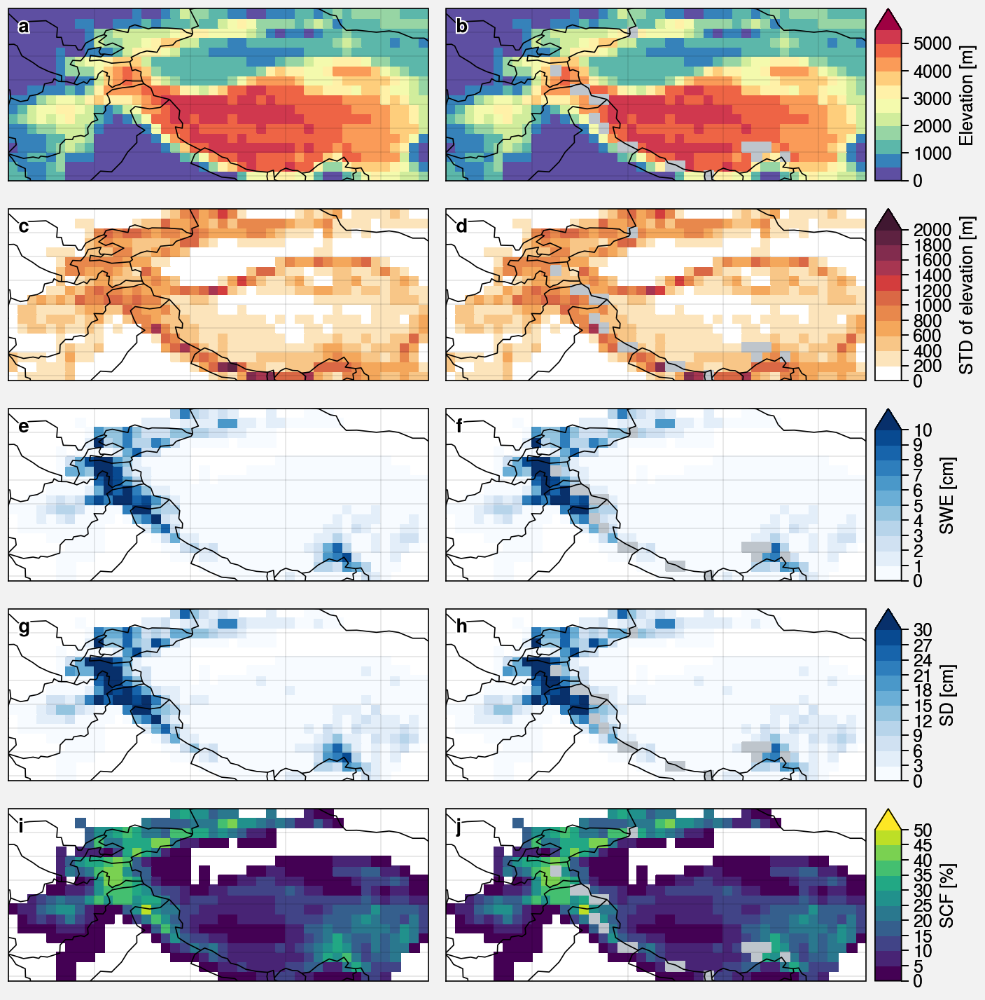

In [171]:
fig, axs = plot.subplots(proj='cyl', ncols=2, nrows=5, axwidth=3)

k = 0
threshold = 30 # percentage of permanent snow in a cell

for i in range(5):
    axs[i, 0].pcolormesh(var_list[i], cmap=cmap_list[i], levels=levels_list[i], extend=extend_list[i])

# With mask
for i in range(5):
    axs[i, 1].pcolormesh(
        var_list[i].where(mask<=threshold), cmap=cmap_list[i], levels=levels_list[i], extend=extend_list[i],
        colorbar='r', colorbar_kw={'label': label_list[i]}
    )
    axs[i, 1].pcolormesh(mask.where(mask>threshold)*0+1, cmap='gray6', levels=[0, 1, 2, 3])

# Format
axs.format(
    borders=True, labels=False, 
    latlim=(latlim.start, latlim.stop), lonlim=(lonlim.start, lonlim.stop),
    abc=True, abcloc='ul',
)

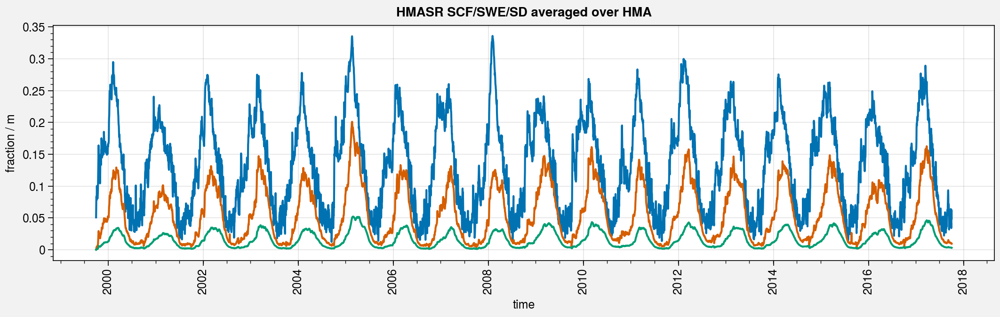

In [172]:
## Only quick plot for visualization
# Not right because only seasonnal snow (so need to weight areas)

fig, axs = plot.subplots(nrows=1, axwidth=10, aspect=4, sharey=0)

ax = axs[0]
ax.plot(u.spatial_average(scf), label='SCF')
ax.plot(u.spatial_average(sd), label='SD [m]')
ax.plot(u.spatial_average(swe), label='SWE [m]')
ax.format(
    ylabel='fraction / m'
)

axs.format(
    suptitle='HMASR SCF/SWE/SD averaged over HMA'
)

## Check SCF/SWE relationship
### Influence of zones

In [3]:
# Get zone limits for annual cycle
lonlim_HK, latlim_HK, lonlim_HM, latlim_HM, lonlim_TP, latlim_TP = u.get_zones()

# HMA for full domain and the following for the above zones
zones = ['HMA', 'HK', 'HM', 'TP']
zones_df = pd.DataFrame(
    [[lonlim, latlim], [lonlim_HK, latlim_HK], [lonlim_HM, latlim_HM], [lonlim_TP, latlim_TP]], 
    columns=pd.Index(['lonlim', 'latlim'], name='Limits'),
    index=pd.Index(zones, name='Zones')
)

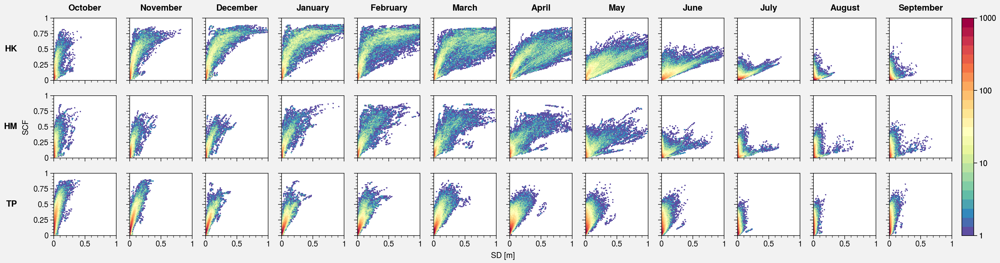

In [174]:
xylim = [[0, 1], [0, 1]]
bins = 100
cmap = 'Spectral_r'
levels = np.logspace(0, 3, 25)
cmin = 1

months = [10, 11, 12, 1, 2, 3, 4, 5, 6, 7, 8, 9]
zones = ['HK', 'HM', 'TP']

fig, axs = plot.subplots(ncols=len(months), nrows=3, axwidth=1)

for j, zone in enumerate(zones):
    for i, month in enumerate(months):
        ax = axs[j, i]
        m = ax.hist2d(
            sd.sel(lat=zones_df.loc[zone].latlim, lon=zones_df.loc[zone].lonlim).where( (sd['time.month'] == month) & (mask < 30) ).values.flatten(),
            scf.sel(lat=zones_df.loc[zone].latlim, lon=zones_df.loc[zone].lonlim).where( (scf['time.month'] == month) & (mask < 30) ).values.flatten(),
            bins=bins, range=xylim, cmap=cmap, cmin=cmin, levels=levels,
        )
        ax.format(
#             title=cld.month_name[month],
            xlabel='SD [m]',
            ylabel='SCF',
        )

fig.colorbar(m[3], ticks=np.logspace(0, 3, 4))

axs.format(
    rowlabels=zones,
    collabels=[cld.month_name[month] for month in months]
)

### Influence of variation of topography

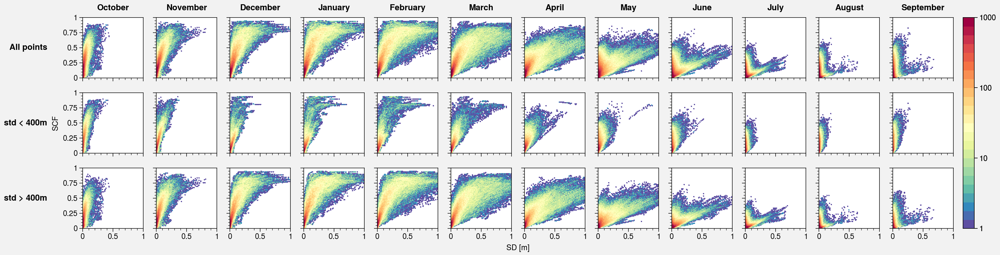

In [175]:
xylim = [[0, 1], [0, 1]]
bins = 100
cmap = 'Spectral_r'
levels = np.logspace(0, 3, 25)
cmin = 1

months = [10, 11, 12, 1, 2, 3, 4, 5, 6, 7, 8, 9]
threshold = 400
stds = [(True), (topo_std < threshold), (topo_std > threshold)]

fig, axs = plot.subplots(ncols=len(months), nrows=3, axwidth=1)

for j, std in enumerate(stds):
    for i, month in enumerate(months):
        ax = axs[j, i]
        m = ax.hist2d(
            sd.where( (sd['time.month'] == month) & (mask < 30) & std).values.flatten(),
            scf.where( (scf['time.month'] == month) & (mask < 30) & std).values.flatten(),
            bins=bins, range=xylim, cmap=cmap, cmin=cmin, levels=levels,
        )
        ax.format(
#             title=cld.month_name[month],
            xlabel='SD [m]',
            ylabel='SCF',
        )

fig.colorbar(m[3], ticks=np.logspace(0, 3, 4))

axs.format(
    rowlabels=['All points', 'std < '+str(threshold)+'m', 'std > '+str(threshold)+'m'],
    collabels=[cld.month_name[month] for month in months]
)

## Reproduce Swenson and Lawrence figures
http://doi.wiley.com/10.1029/2012JD018178

Figure 6 and 8

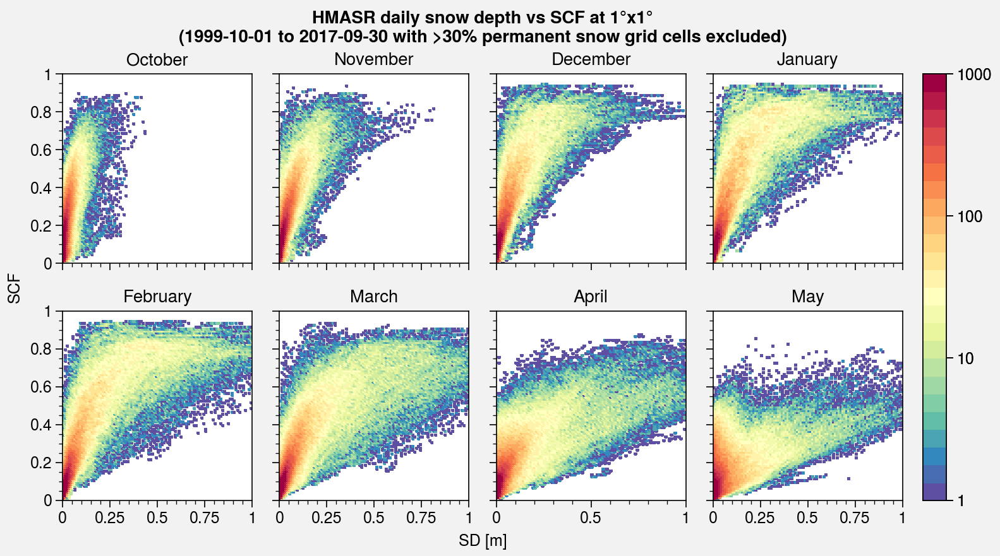

In [176]:
xylim = [[0, 1], [0, 1]]
bins = 100
cmap = 'Spectral_r'
levels = np.logspace(0, 3, 25)
cmin = 1

months = [10, 11, 12, 1, 2, 3, 4, 5]

fig, axs = plot.subplots(ncols=4, nrows=2, axwidth=1.5)

for ax, month in zip(axs, months):
    m = ax.hist2d(
        sd.where( (sd['time.month'] == month) & (mask < 30)).values.flatten(),
        scf.where( (scf['time.month'] == month) & (mask < 30)).values.flatten(),
        bins=bins, range=xylim, cmap=cmap, cmin=cmin, levels=levels,
    )
    ax.format(
        title=cld.month_name[month],
        xlabel='SD [m]',
        ylabel='SCF',
    )

fig.colorbar(m[3], ticks=np.logspace(0, 3, 4))

axs.format(
    suptitle='HMASR daily snow depth vs SCF at 1°x1°\n(1999-10-01 to 2017-09-30 with >30% permanent snow grid cells excluded)'
)

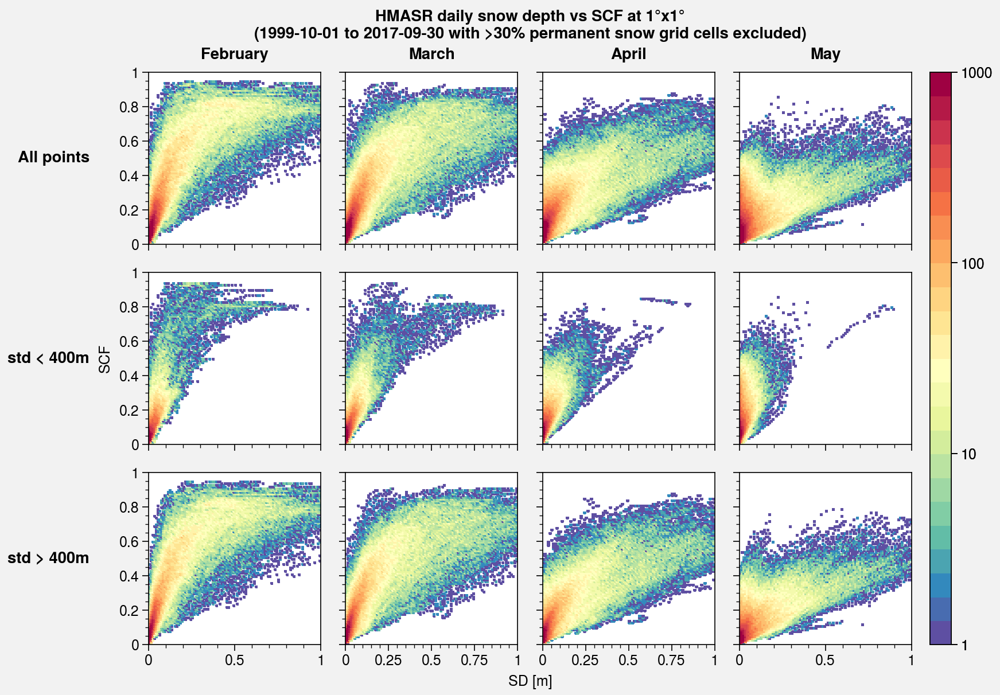

In [177]:
xylim = [[0, 1], [0, 1]]
bins = 100
cmap = 'Spectral_r'
levels = np.logspace(0, 3, 25)
cmin = 1

months = [2, 3, 4, 5]
threshold = 400
stds = [(True), (topo_std < threshold), (topo_std > threshold)]

fig, axs = plot.subplots(ncols=len(months), nrows=3, axwidth=1.5)

for j, std in enumerate(stds):
    for i, month in enumerate(months):
        ax = axs[j, i]
        m = ax.hist2d(
            sd.where( (sd['time.month'] == month) & (mask < 30) & std).values.flatten(),
            scf.where( (scf['time.month'] == month) & (mask < 30) & std).values.flatten(),
            bins=bins, range=xylim, cmap=cmap, cmin=cmin, levels=levels,
        )
        ax.format(
#             title=cld.month_name[month],
            xlabel='SD [m]',
            ylabel='SCF',
        )

fig.colorbar(m[3], ticks=np.logspace(0, 3, 4))

axs.format(
    rowlabels=['All points', 'std < '+str(threshold)+'m', 'std > '+str(threshold)+'m'],
    collabels=[cld.month_name[month] for month in months],
    suptitle='HMASR daily snow depth vs SCF at 1°x1°\n(1999-10-01 to 2017-09-30 with >30% permanent snow grid cells excluded)'
)

# fig.save('img/HMASR_SD_SCF_100km_1999-2017_30_STD_400.jpg')

In [178]:
# Compute relative depth

max_year = sd.where( (sd['time.month'] >= 2) & (sd['time.month'] <= 5) ).groupby('time.year').max()
sd_depl = sd.where( (sd['time.month'] >= 2) & (sd['time.month'] <= 5) )
scf_depl = scf.where( (scf['time.month'] >= 2) & (scf['time.month'] <= 5) )

sd_depl_norm = sd_depl.copy()
for year in max_year.year.values:
    sd_depl_norm.loc[dict(time=str(year))] = sd_depl.sel(time=str(year))/max_year.sel(year=year)

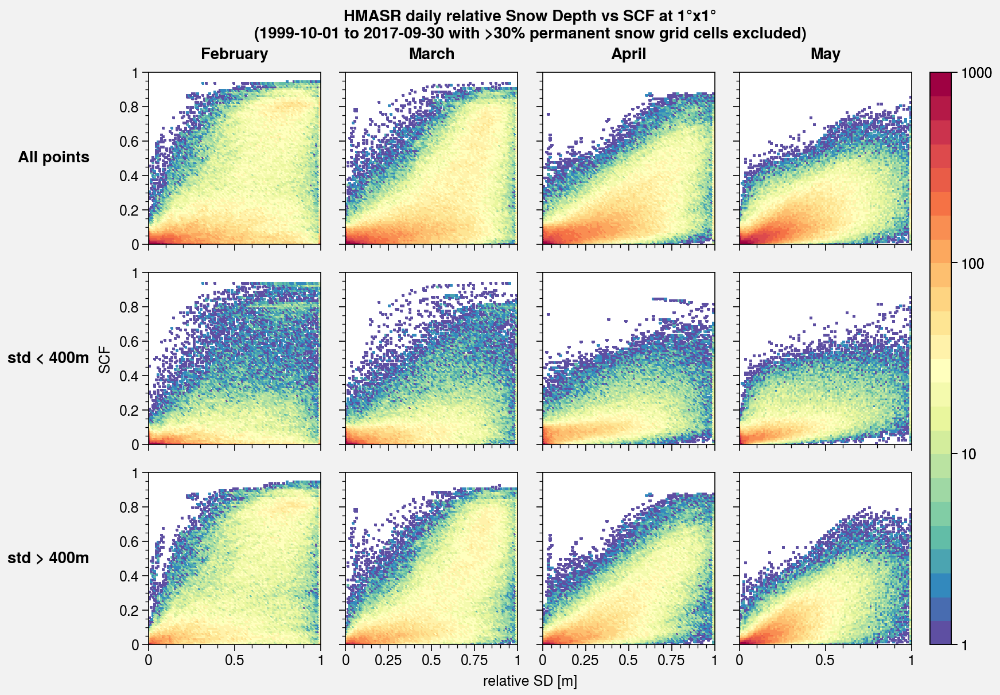

In [179]:
xylim = [[0, 1], [0, 1]]
bins = 100
cmap = 'Spectral_r'
levels = np.logspace(0, 3, 25)
cmin = 1

months = [2, 3, 4, 5]
threshold = 400
stds = [(True), (topo_std < threshold), (topo_std > threshold)]

fig, axs = plot.subplots(ncols=len(months), nrows=3, axwidth=1.5)

for j, std in enumerate(stds):
    for i, month in enumerate(months):
        ax = axs[j, i]
        m = ax.hist2d(
            sd_depl_norm.where( (sd['time.month'] == month) & (mask < 30) & std).values.flatten(),
            scf.where( (scf['time.month'] == month) & (mask < 30) & std).values.flatten(),
            bins=bins, range=xylim, cmap=cmap, cmin=cmin, levels=levels,
        )
        ax.format(
#             title=cld.month_name[month],
            xlabel='relative SD [m]',
            ylabel='SCF',
        )

fig.colorbar(m[3], ticks=np.logspace(0, 3, 4))

axs.format(
    rowlabels=['All points', 'std < '+str(threshold)+'m', 'std > '+str(threshold)+'m'],
    collabels=[cld.month_name[month] for month in months],
    suptitle='HMASR daily relative Snow Depth vs SCF at 1°x1°\n(1999-10-01 to 2017-09-30 with >30% permanent snow grid cells excluded)'
)

# fig.save('img/HMASR_rel_SD_SCF_100km_1999-2017_30_STD_400.jpg')

We don't obtain similar plot than SL12 for this last plot with relative depth. It might be because there are not much flat areas over HMA, and in addition flat areas are quite dry over the TP.

In [180]:
# Compute relative depth

max_year = sd.where( (swe['time.month'] >= 2) & (swe['time.month'] <= 5) ).groupby('time.year').max()
swe_depl = sd.where( (swe['time.month'] >= 2) & (swe['time.month'] <= 5) )
scf_depl = scf.where( (scf['time.month'] >= 2) & (scf['time.month'] <= 5) )

swe_depl_norm = swe_depl.copy()
for year in max_year.year.values:
    swe_depl_norm.loc[dict(time=str(year))] = swe_depl.sel(time=str(year))/max_year.sel(year=year)

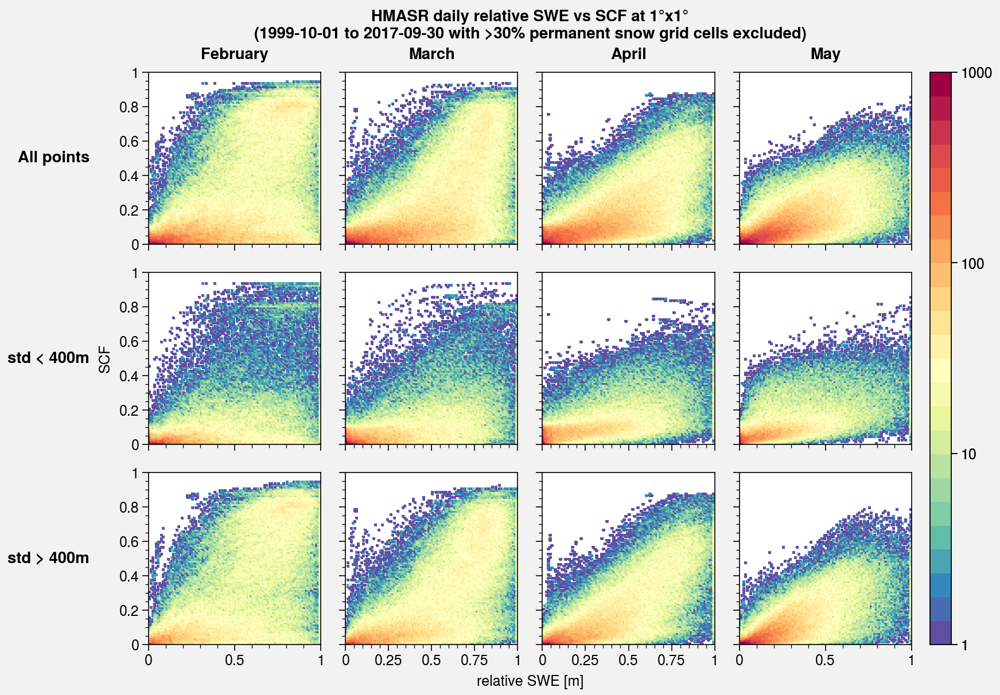

In [181]:
xylim = [[0, 1], [0, 1]]
bins = 100
cmap = 'Spectral_r'
levels = np.logspace(0, 3, 25)
cmin = 1

months = [2, 3, 4, 5]
threshold = 400
stds = [(True), (topo_std < threshold), (topo_std > threshold)]

fig, axs = plot.subplots(ncols=len(months), nrows=3, axwidth=1.5)

for j, std in enumerate(stds):
    for i, month in enumerate(months):
        ax = axs[j, i]
        m = ax.hist2d(
            swe_depl_norm.where( (sd['time.month'] == month) & (mask < 30) & std).values.flatten(),
            scf.where( (scf['time.month'] == month) & (mask < 30) & std).values.flatten(),
            bins=bins, range=xylim, cmap=cmap, cmin=cmin, levels=levels,
        )
        ax.format(
#             title=cld.month_name[month],
            xlabel='relative SWE [m]',
            ylabel='SCF',
        )

fig.colorbar(m[3], ticks=np.logspace(0, 3, 4))

axs.format(
    rowlabels=['All points', 'std < '+str(threshold)+'m', 'std > '+str(threshold)+'m'],
    collabels=[cld.month_name[month] for month in months],
    suptitle='HMASR daily relative SWE vs SCF at 1°x1°\n(1999-10-01 to 2017-09-30 with >30% permanent snow grid cells excluded)'
)

### Compare to Niu and Yang 2007

In [140]:
def NY07(sd, z0, rho_snow, rho_new, m):
    scf = np.tanh(sd/(2.5*z0*(rho_snow/rho_new)**m))
    return scf.where((sd>1e-7) & (swe>1e-7) & (rho_snow<917), other=0).where( (sd*0+1) == 1).where(mask < 30)

scf_NY07_orig = NY07(sd, 0.01, swe/sd*1000, 100, 1.6)
scf_NY07_orch = NY07(sd, 0.01, swe/sd*1000, 50, 1)

### Check density

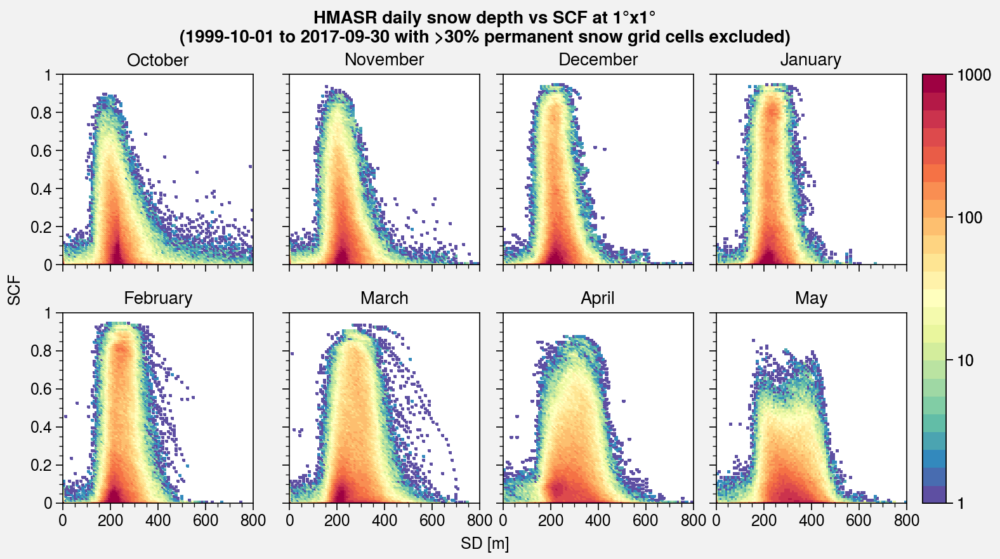

In [184]:
xylim = [[0, 800], [0, 1]]
bins = 100
cmap = 'Spectral_r'
levels = np.logspace(0, 3, 25)
cmin = 1

months = [10, 11, 12, 1, 2, 3, 4, 5]

fig, axs = plot.subplots(ncols=4, nrows=2, axwidth=1.5)

for ax, month in zip(axs, months):
    m = ax.hist2d(
        (swe/sd*1000).where( (sd['time.month'] == month) & (mask < 30)).values.flatten(),
        scf.where( (scf['time.month'] == month) & (mask < 30)).values.flatten(),
        bins=bins, range=xylim, cmap=cmap, cmin=cmin, levels=levels,
    )
    ax.format(
        title=cld.month_name[month],
        xlabel='SD [m]',
        ylabel='SCF',
    )

fig.colorbar(m[3], ticks=np.logspace(0, 3, 4))

axs.format(
    suptitle='HMASR daily snow depth vs SCF at 1°x1°\n(1999-10-01 to 2017-09-30 with >30% permanent snow grid cells excluded)'
)

In [185]:
(swe/sd.where( (sd>swe) )*1000).where(mask < 30).groupby('time.month').mean('time').mean(('lat', 'lon'))

<xarray.DataArray (month: 12)>
array([228.31798, 237.87929, 264.8633 , 290.05188, 299.25375, 297.8882 ,
       289.63568, 273.43994, 256.29376, 230.40762, 224.48651, 227.44112],
      dtype=float32)
Coordinates:
  * month    (month) int64 1 2 3 4 5 6 7 8 9 10 11 12

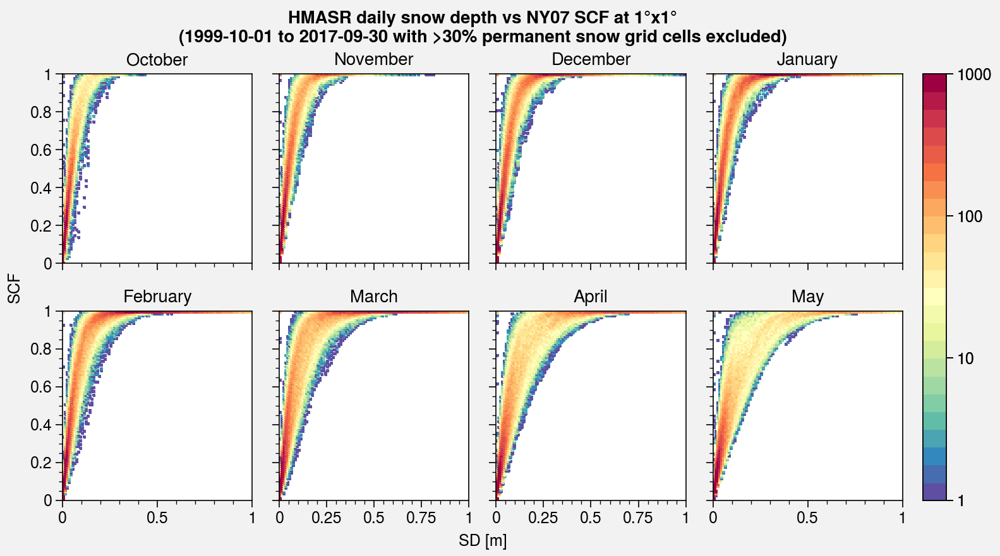

In [186]:
xylim = [[0, 1], [0, 1]]
bins = 100
cmap = 'Spectral_r'
levels = np.logspace(0, 3, 25)
cmin = 1

months = [10, 11, 12, 1, 2, 3, 4, 5]

fig, axs = plot.subplots(ncols=4, nrows=2, axwidth=1.5)

for ax, month in zip(axs, months):
    m = ax.hist2d(
        sd.where( (sd['time.month'] == month) & (mask < 30)).values.flatten(),
        scf_NY07_orig.where( (scf['time.month'] == month) & (mask < 30)).values.flatten(),
        bins=bins, range=xylim, cmap=cmap, cmin=cmin, levels=levels,
    )
    ax.format(
        title=cld.month_name[month],
        xlabel='SD [m]',
        ylabel='SCF',
    )

fig.colorbar(m[3], ticks=np.logspace(0, 3, 4))

axs.format(
    suptitle='HMASR daily snow depth vs NY07 SCF at 1°x1°\n(1999-10-01 to 2017-09-30 with >30% permanent snow grid cells excluded)'
)

# fig.save('img/HMASR_SD_NY07_SCF_100km_1999-2017_30_Oct-May.jpg')

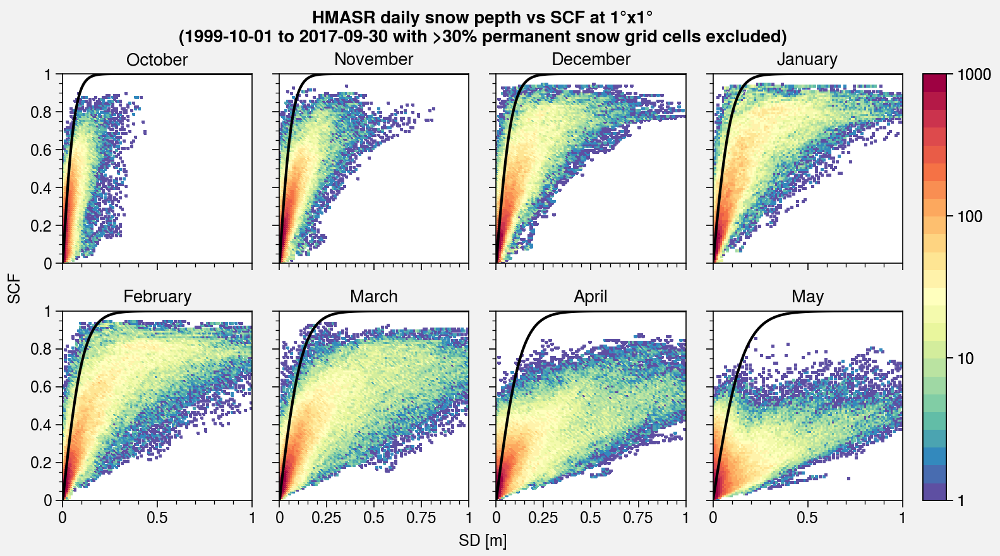

In [189]:
xylim = [[0, 1], [0, 1]]
bins = 100
cmap = 'Spectral_r'
levels = np.logspace(0, 3, 25)
cmin = 1

months = [10, 11, 12, 1, 2, 3, 4, 5]
densities_NY07 = [175.647, 186.066, 209.181, 229.853, 250.957, 265.962, 279.74, 318.128]
densities_HMASR = (swe/sd.where( (sd>swe) )*1000).where(mask < 30).groupby('time.month').mean('time').mean(('lat', 'lon')).values

fig, axs = plot.subplots(ncols=4, nrows=2, axwidth=1.5)

for ax, month, rho_NY07, rho_HMASR in zip(axs, months, densities_NY07, densities_HMASR):
    m = ax.hist2d(
        sd.where( (sd['time.month'] == month) & (mask < 30)).values.flatten(),
        scf.where( (scf['time.month'] == month) & (mask < 30)).values.flatten(),
        bins=bins, range=xylim, cmap=cmap, cmin=cmin, levels=levels,
    )
    x = plot.arange(0, 1, 0.01)
    ax.plot(x, np.tanh(x/(2.5*0.01*(rho_NY07/100)**1.6)), color='k')
#     ax.plot(x, NY07(x, 0.01, rho_HMASR, 100, 1.6), color='k')
    ax.format(
        title=cld.month_name[month],
        xlabel='SD [m]',
        ylabel='SCF',
    )

fig.colorbar(m[3], ticks=np.logspace(0, 3, 4))

axs.format(
    suptitle='HMASR daily snow pepth vs SCF at 1°x1°\n(1999-10-01 to 2017-09-30 with >30% permanent snow grid cells excluded)'
)

# fig.save('img/HMASR_SD_SCF_100km_1999-2017_30_Oct-May_NY07.jpg')

## Make plot functions

### Compute weights
Taking into account:
- cos(lat)
- fraction of seasonal snow in a grid cell
- exclude cells with >30% of permanent snow

Weigths used to compute metrics (but not for optimization? -> maybe)

In [149]:
lat_weights = np.cos(np.deg2rad(scf.lat))
frac_seasonal_snow = (1-mask/100).where(scf[0]*0+1 == 1)
temp = (frac_seasonal_snow*lat_weights).where(mask<30)
weights = (temp / temp.sum()).fillna(0)
np.testing.assert_equal(weights.sum().values.item(0), 1)

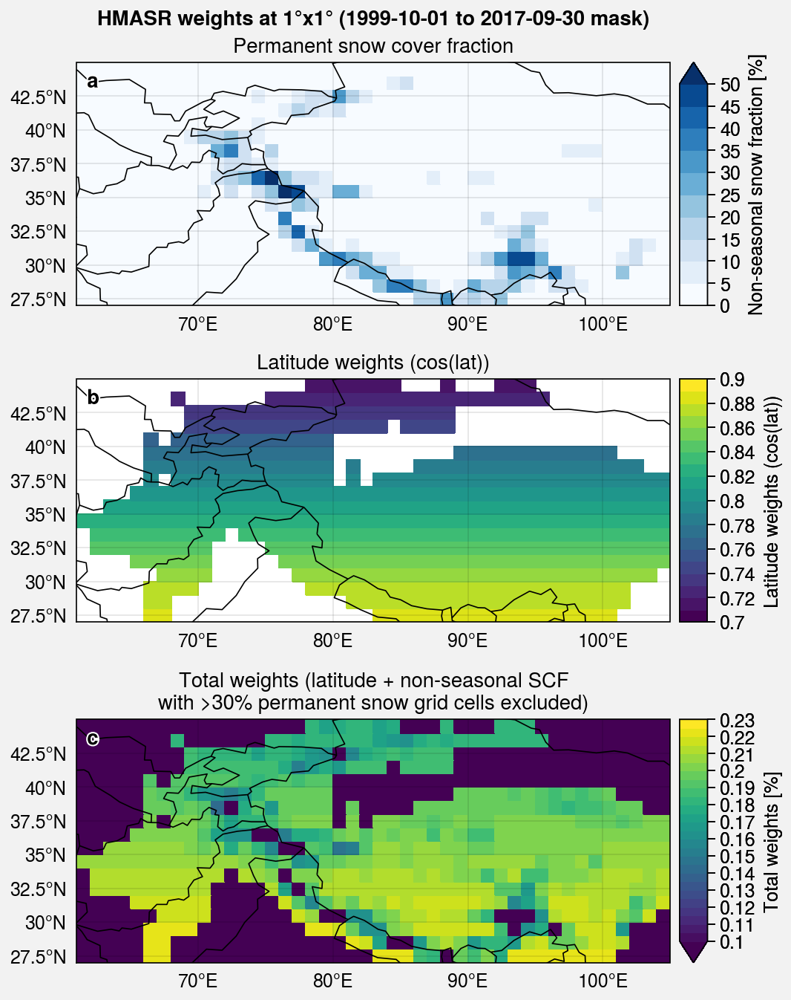

In [150]:
fig, axs = plot.subplots(proj='cyl', ncols=1, nrows=3, axwidth=4)

threshold = 30 # percentage of permanent snow in a cell

axs[0].pcolormesh(mask, levels=plot.arange(0, 50, 5), extend='max', cmap='Blues',
                 colorbar='r', colorbar_kw={'label': 'Non-seasonal snow fraction [%]'})
axs[0].format(title='Permanent snow cover fraction')

axs[1].pcolormesh((scf[0]*0+1)*lat_weights, levels=plot.arange(0.7, 0.9, 0.01), cmap='viridis',
                 colorbar='r', colorbar_kw={'label': 'Latitude weights (cos(lat))'})
axs[1].format(title='Latitude weights (cos(lat))')


axs[2].pcolormesh(weights*100, levels=plot.arange(0.0010, 0.0023, 0.00005)*100, cmap='viridis', extend='min',
                 colorbar='r', colorbar_kw={'label': 'Total weights [%]'})
axs[2].format(title='Total weights (latitude + non-seasonal SCF\nwith >30% permanent snow grid cells excluded)')


# Format
axs.format(
    borders=True, labels=True, 
    latlim=(latlim.start, latlim.stop), lonlim=(lonlim.start, lonlim.stop),
    suptitle='HMASR weights at 1°x1° (1999-10-01 to 2017-09-30 mask)',
    abc=True, abcloc='ul'
)

### SCF vs SD

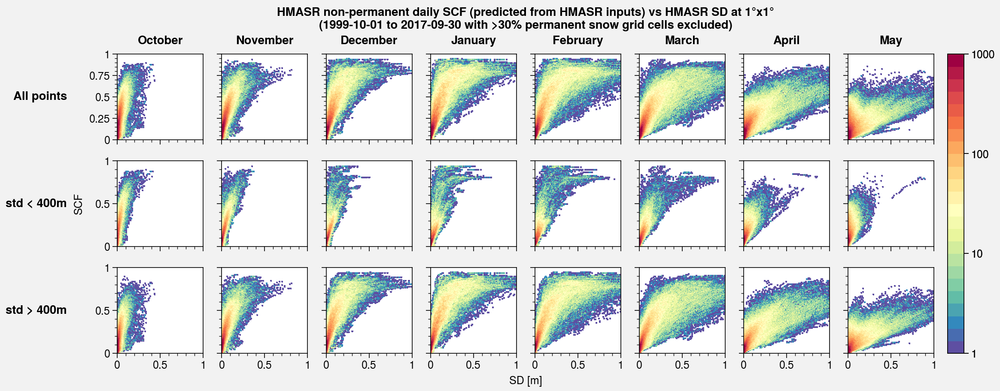

In [185]:
def plot_scf_vs_sd(scf, sd, param, save=False):
    xylim = [[0, 1], [0, 1]]
    bins = 100
    cmap = 'Spectral_r'
    levels = np.logspace(0, 3, 25)
    cmin = 1

    months = [10, 11, 12, 1, 2, 3, 4, 5]
    threshold = 400
    stds = [(True), (topo_std < threshold), (topo_std > threshold)]

    fig, axs = plot.subplots(ncols=len(months), nrows=3, axwidth=1)

    for j, std in enumerate(stds):
        for i, month in enumerate(months):
            ax = axs[j, i]
            m = ax.hist2d(
                sd.where( (sd['time.month'] == month) & (mask < 30) & std).values.flatten(),
                scf.where( (scf['time.month'] == month) & (mask < 30) & std).values.flatten(),
                bins=bins, range=xylim, cmap=cmap, cmin=cmin, levels=levels,
            )
            ax.format(xlabel='SD [m]', ylabel='SCF')

    fig.colorbar(m[3], ticks=np.logspace(0, 3, 4))

    axs.format(
        rowlabels=['All points', 'std < '+str(threshold)+'m', 'std > '+str(threshold)+'m'],
        collabels=[cld.month_name[month] for month in months],
        suptitle=param+' non-permanent daily SCF (predicted from HMASR inputs) vs HMASR SD at 1°x1°\n(1999-10-01 to 2017-09-30 with >30% permanent snow grid cells excluded)'
    )

    if save:
        fig.save('img/HMASR_SD_vs_'+param+'_SCF_100km_1999-2017_30_STD_400.jpg')

plot_scf_vs_sd(scf, sd, 'HMASR', save=False)

### Spatial SCF

In [151]:
def NY07(sd, z0, rho_snow, rho_new, m):
    scf = np.tanh(sd/(2.5*z0*(rho_snow/rho_new)**m))
    return scf.where((sd>1e-7) & (swe>1e-7) & (rho_snow<917), other=0).where( (sd*0+1) == 1).where(mask < 30)

scf_NY07_orig = NY07(sd, 0.01, swe/sd*1000, 100, 1.6)
scf_NY07_orch = NY07(sd, 0.01, swe/sd*1000, 50, 1)

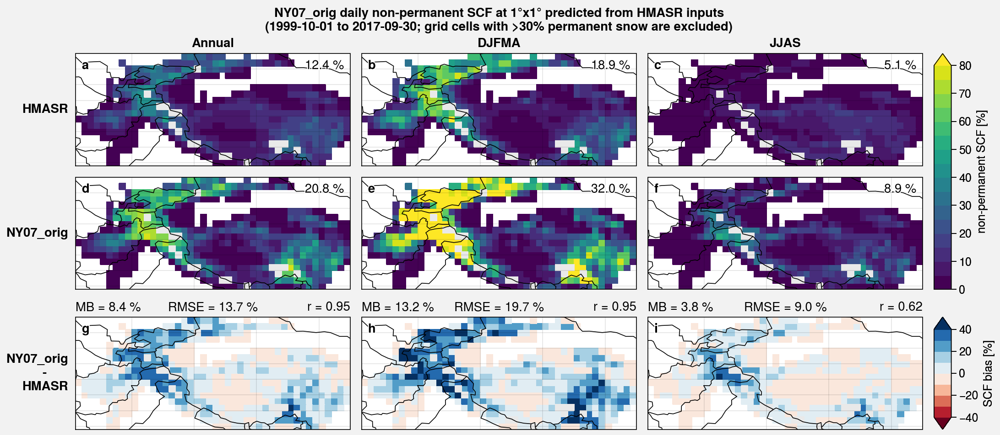

In [180]:
def plot_spatial_scf(scf_ref, scf_param, param, save=False):
    seasons=['Annual', 'DJFMA', 'JJAS']; fred='D'
    levels=plot.arange(0, 80, 5); extend='max'; cmap='viridis'
    levels_bias=plot.arange(-40, 40, 10); extend_bias='both'; cmap_bias='RdBu'
    threshold=30 # percentage of permanent snow in a cell

    fig, axs = plot.subplots(proj='cyl', ncols=len(seasons), nrows=3, axwidth=3)

    # HMASR
    for i, season in enumerate(seasons):
        data = u.clim(scf_ref, freq=fred, season=season, skipna=True)*100
        m = axs[0, i].pcolormesh(data, levels=levels, extend=extend, cmap=cmap)
        axs[0, i].format(urtitle='{:.1f} %'.format(data.weighted(weights).sum().values.item(0)))

    # param
    for i, season in enumerate(seasons):
        data = u.clim(scf_param, freq=fred, season=season, skipna=True)*100
        axs[1, i].pcolormesh(data, levels=levels, extend=extend, cmap=cmap)
        axs[1, i].format(urtitle='{:.1f} %'.format(data.weighted(weights).sum().values.item(0)))

    # bias
    for i, season in enumerate(seasons):
        scf_param_clim = u.clim(scf_param, freq=fred, season=season, skipna=True)*100
        scf_ref_clim = u.clim(scf_ref, freq=fred, season=season, skipna=True)*100
        
        m_bias = axs[2, i].pcolormesh(scf_param_clim-scf_ref_clim, levels=levels_bias, extend=extend_bias, cmap=cmap_bias)
        
        mb = u.weighted_mean(scf_param_clim-scf_ref_clim, weights).values.item(0)
        rmse = u.weighted_rmse(scf_param_clim, scf_ref_clim, weights).values.item(0)
        r = u.weighted_corr(scf_param_clim, scf_ref_clim, weights).values.item(0)
        axs[2, i].format(ltitle='MB = {:.1f} %'.format(mb), ctitle='RMSE = {:.1f} %'.format(rmse), rtitle='r = {:.2}'.format(r))

    # mask
    for ax in axs:
        ax.pcolormesh(mask.where(mask>threshold)*0+1, cmap='lightgray', levels=[0, 1, 2, 3])
    #     ax.format(utitle='aze')

    # Colorbars
    fig.colorbar(m, label='non-permanent SCF [%]', rows=(1, 2), ticks=10)
    fig.colorbar(m_bias, label='SCF bias [%]', row=3, ticks=20)

    # Format
    axs.format(
        borders=True, labels=False, 
        latlim=(latlim.start, latlim.stop), lonlim=(lonlim.start, lonlim.stop),
        suptitle=param+' daily non-permanent SCF at 1°x1° predicted from HMASR inputs\n(1999-10-01 to 2017-09-30; grid cells with >30% permanent snow are excluded)',
        abc=True, abcloc='ul',
        collabels=seasons, rowlabels=['HMASR', param, param+'\n-      \nHMASR'],
    )
    
    if save:
        fig.save('img/HMASR_SCF_vs_'+param+'_SCF_100km_1999-2017_30.jpg')
    
plot_spatial_scf(scf, scf_NY07_orig, 'NY07_orig', save=False)

### Time series and annual cycle

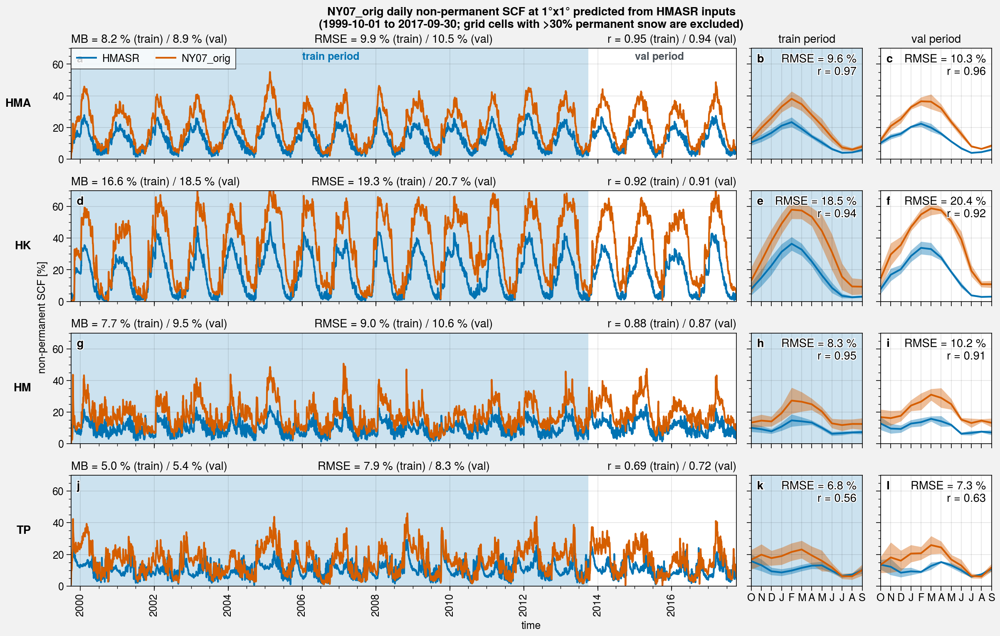

In [178]:
train_period = slice('1999-10-01', '2013-09-30') # ~80%
val_period = slice('2013-10-01', '2017-09-30') # ~20%

def plot_ts(scf_ref, scf_param, param, y_max=50, save=False):
    import warnings
    warnings.filterwarnings("ignore")
    zones = ['HMA', 'HK', 'HM', 'TP']
    
    fig, axs = plot.subplots(nrows=len(zones), ncols=3, axwidth=8, ref=1, wratios=(6, 1, 1), aspect=6)

    ###################
    ### Time series ###
    ###################
    for i, zone in enumerate(zones):
        ax = axs[i, 0]


        ts_list = []
        for da, label in zip([scf_ref, scf_param], ['HMASR', param]):
            ts = da.sel(lat=zones_df.loc[zone].latlim, lon=zones_df.loc[zone].lonlim).weighted(weights).mean(('lat', 'lon'))*100
            ax.plot(ts, label=label)
            ts_list.append(ts)

        # Validation shading
#         ax.fill_between(da.sel(time=train_period).time, 0, y_max, alpha=0.2)
        ax.fill_between([da.time.values[0], da.sel(time=train_period).time.values[-1]], 0, y_max, alpha=0.2)

        # Compute metrics
        df = pd.DataFrame(index=['train', 'val'], columns=['mb', 'rmse', 'r'])
        for period, dataset in zip([train_period, val_period], ['train', 'val']):
            mb = (ts_list[1]-ts_list[0]).sel(time=period).mean().item(0)
            rmse = np.sqrt(((ts_list[1]-ts_list[0])**2).sel(time=period).mean().item(0))
            r = stats.pearsonr(ts_list[1].sel(time=period), ts_list[0].sel(time=period))[0]
            df.loc[dataset] = [mb, rmse, r]

        ax.format(
            ylabel='non-permanent SCF [%]',
            xlim=(da.time.values[0], da.time.values[-1]),
            ltitle='MB = {:.1f} % (train) / {:.1f} % (val)'.format(df.loc['train'].mb, df.loc['val'].mb),
            ctitle='RMSE = {:.1f} % (train) / {:.1f} % (val)'.format(df.loc['train'].rmse, df.loc['val'].rmse),
            rtitle='r = {:.2f} (train) / {:.2f} (val)'.format(df.loc['train'].r, df.loc['val'].r),
        )

    axs[0].text(np.datetime64('2006-01-01'), y_max-7, 'train period', color='C0', weight='bold')
    axs[0].text(np.datetime64('2015-01-01'), y_max-7, 'val period', color='gray7', weight='bold')
    axs[0].legend(loc='ul')

    ####################
    ### Annual cycle ###
    ####################
    for i, zone in enumerate(zones):
        for j, period in enumerate([train_period, val_period]):
            ax = axs[i, j+1]

            ac_list = []
            for da in [scf_ref, scf_param]:
                ac = da.sel(lat=zones_df.loc[zone].latlim, lon=zones_df.loc[zone].lonlim, time=period) \
                            .groupby('time.month').mean() \
                            .weighted(weights).mean(('lat', 'lon'))*100
                std = da.sel(lat=zones_df.loc[zone].latlim, lon=zones_df.loc[zone].lonlim, time=period) \
                            .weighted(weights).mean(('lat', 'lon')) \
                            .resample(time='M').mean() \
                            .groupby('time.month').std()*100

                ac_list.append(ac)

                ac_shift = ac.reindex(month=np.roll(ac.month,3))
                std_shift = std.reindex(month=np.roll(std.month,3))
                shadedata = [(ac_shift-std_shift).values, (ac_shift+std_shift).values]

                ax.plot(ac_shift.values, shadedata=shadedata, label='SCF')

            if j == 0:
                # Validation shading
                ax.fill_between(range(12), 0, y_max, alpha=0.2)


            # Compute metrics
            mb = (ac_list[1]-ac_list[0]).mean().item(0)
            rmse = np.sqrt(((ac_list[1]-ac_list[0])**2).mean().item(0))
            r = stats.pearsonr(ac_list[1], ac_list[0])[0]

            ax.format(
                xlocator='index', xformatter=[cld.month_abbr[month][0] for month in ac.reindex(month=np.roll(ac.month,3)).month.values],
                urtitle='RMSE = {:.1f} %\nr = {:.2f}'.format(rmse, r),
            )


    axs[1].format(title='train period')
    axs[2].format(title='val period')

    for ax in axs:
        ax.autoscale(tight=True)

    axs.format(
        suptitle=param+' daily non-permanent SCF at 1°x1° predicted from HMASR inputs\n' \
                 '(1999-10-01 to 2017-09-30; grid cells with >30% permanent snow are excluded)',
        rowlabels=zones,
        abc=True, abcloc='ul',
        ylim=(0, y_max), ylabel='non-permanent SCF [%]',
    )
    
    if save:
        fig.save('img/HMASR_vs_'+param+'_SCF_ts_ac_100km_1999-2017_30.jpg')
    
plot_ts(scf, scf_NY07_orig, 'NY07_orig', y_max=70, save=False)

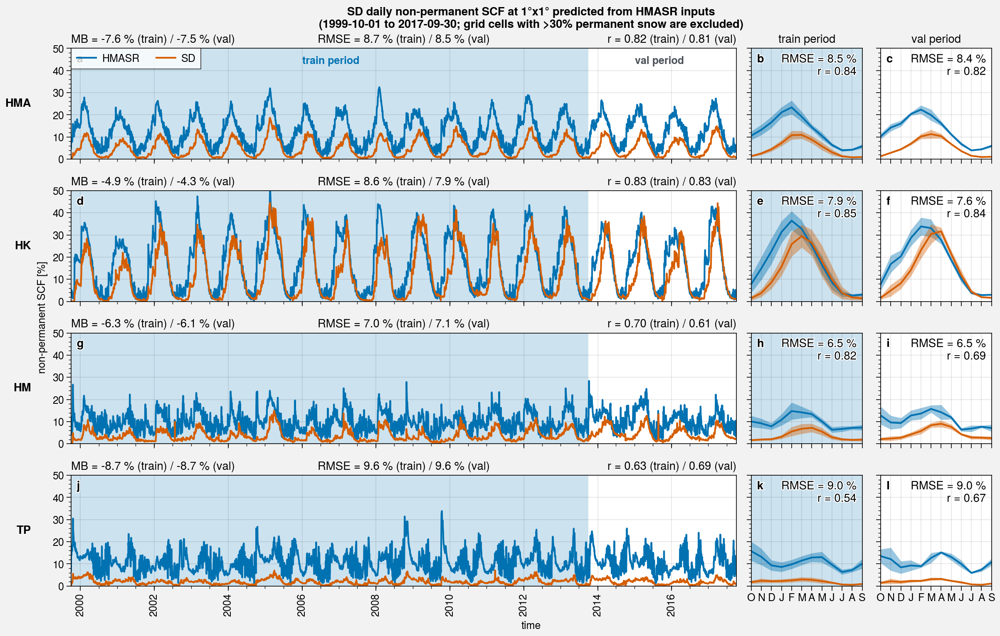

In [179]:
plot_ts(scf, sd, 'SD', save=False)

## Check Niu and Yan 2007

In [170]:
def NY07(sd, z0, rho_snow, rho_new, m):
    scf = np.tanh(sd/(2.5*z0*(rho_snow/rho_new)**m))
    return scf.where((sd>1e-7) & (swe>1e-7) & (rho_snow<917), other=0).where( (sd*0+1) == 1).where(mask < 30)

scf_NY07_orig = NY07(sd, 0.01, swe/sd*1000, 100, 1.6)
scf_NY07_orch = NY07(sd, 0.01, swe/sd*1000, 50, 1)

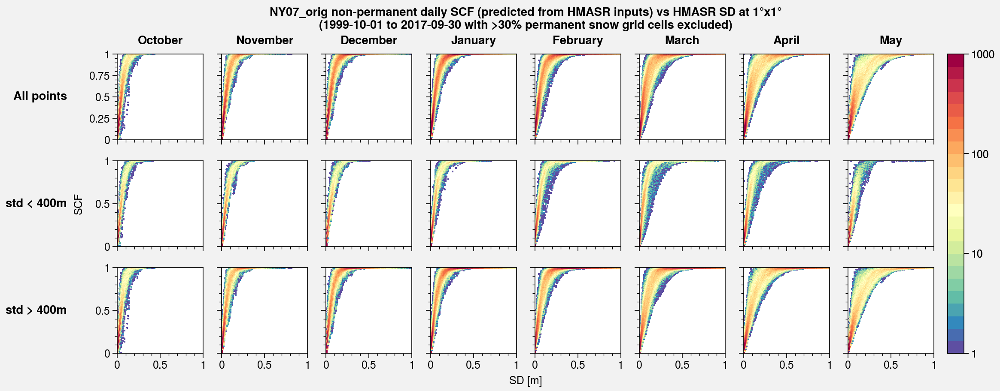

In [186]:
plot_scf_vs_sd(scf_NY07_orig, sd, 'NY07_orig', save=True)

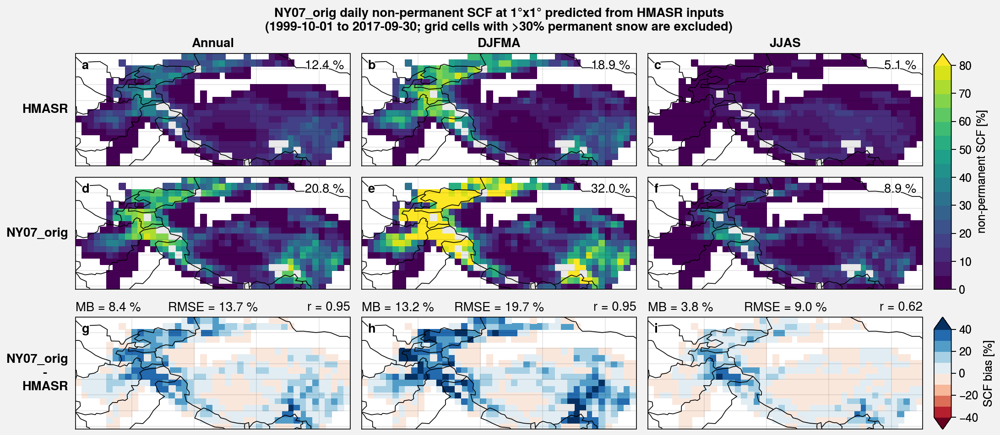

In [187]:
plot_spatial_scf(scf, scf_NY07_orig, 'NY07_orig', save=False)

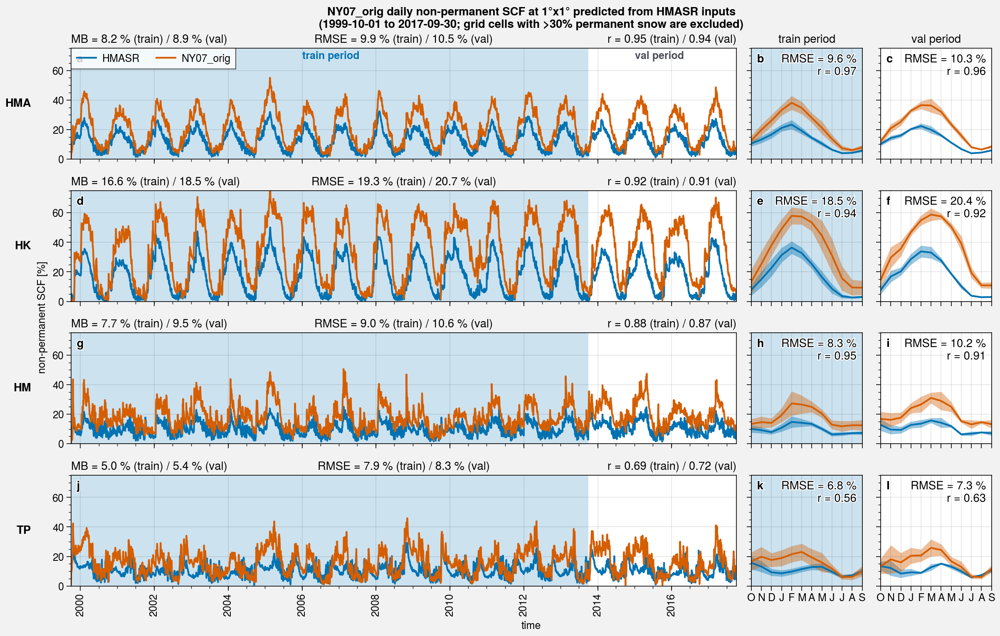

In [188]:
plot_ts(scf, scf_NY07_orig, 'NY07_orig', y_max=75, save=False)

## Optimize
https://stackoverflow.com/questions/13670333/multiple-variables-in-scipys-optimize-minimize

Faire gaffe à prendre la bonne STD par la suite et à virer sd>swe + 30% permanent snow

In [77]:
# https://stackoverflow.com/questions/13670333/multiple-variables-in-scipys-optimize-minimize

import scipy.optimize as optimize

def f(params):
    # print(params)  # <-- you'll see that params is a NumPy array
    z0, rho_new, m = params # <-- for readability you may wish to assign names to the component variables
    
    # rmse doesn't work... 
    # I don't know what method to use... I keep the default one here
#     mse = np.sum((np.tanh(sd_regrid/(2.5*z0*(swe_regrid/sd_regrid*1000/rho_new)**m)) - scf_regrid)**2)/scf_regrid.size
    mse = np.sum((NY07(sd_regrid, z0, swe_regrid/sd_regrid*1000, rho_new, m) - scf_regrid)**2)/scf_regrid.size
    
    return mse

initial_guess = [0.01, 50, 1]
result = optimize.minimize(f, initial_guess)
if result.success:
    fitted_params = result.x
    print(fitted_params)
    print('MSE = {:0.3f}'.format(result.fun) + ' / RMSE = {:0.3f}'.format(np.sqrt(result.fun)) + ' ({:0.1f} %)'.format(np.sqrt(result.fun)*100))
else:
    raise ValueError(result.message)

[4.39022129e-03 4.99987644e+01 2.46629896e+00]
MSE = 0.019 / RMSE = 0.139 (13.9 %)


In [72]:
initial_guess = [0.01, 100, 1.6]
mse = (f(initial_guess)).values
print('MSE = {:0.3f}'.format(mse) + ' / RMSE = {:0.3f}'.format(np.sqrt(mse)) + ' ({:0.1f} %)'.format(np.sqrt(mse)*100))

MSE = 0.149 / RMSE = 0.386 (38.6 %)


In [73]:
initial_guess = [0.01, 50, 1]
mse = (f(initial_guess)).values
print('MSE = {:0.3f}'.format(mse) + ' / RMSE = {:0.3f}'.format(np.sqrt(mse)) + ' ({:0.1f} %)'.format(np.sqrt(mse)*100))

MSE = 0.146 / RMSE = 0.383 (38.3 %)


Diminution de ~38% -> 14%

In [78]:
initial_guess = [0.01, 100, 1.6]
result = optimize.minimize(f, initial_guess)
if result.success:
    fitted_params = result.x
    print(fitted_params)
    print('MSE = {:0.3f}'.format(result.fun) + ' / RMSE = {:0.3f}'.format(np.sqrt(result.fun)) + ' ({:0.1f} %)'.format(np.sqrt(result.fun)*100))
else:
    raise ValueError(result.message)

[2.42691772e-02 1.00008946e+02 2.46626450e+00]
MSE = 0.019 / RMSE = 0.139 (13.9 %)


2 solution équivalentes :
- z0 = 0.0044 (4.4 mm), rho_new = 50 kg/m3, m = 2.47
- z0 = 0.0243 (2.4 cm), rho_new = 100 kg/m3, m = 2.47

In [14]:
scf_NY07_opti = NY07(sd_regrid, 0.0044, swe_regrid/sd_regrid*1000, 50, 2.47)

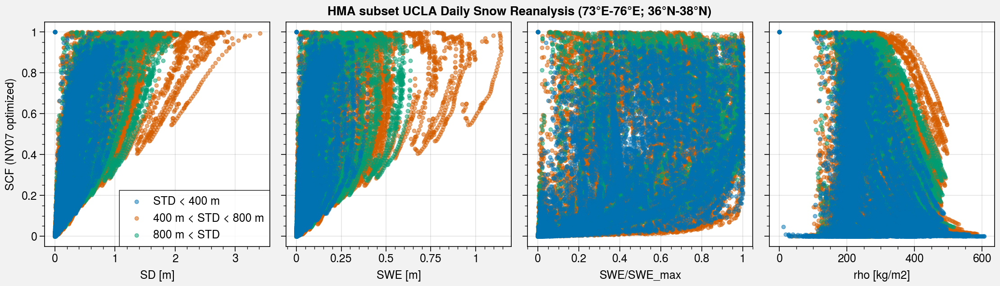

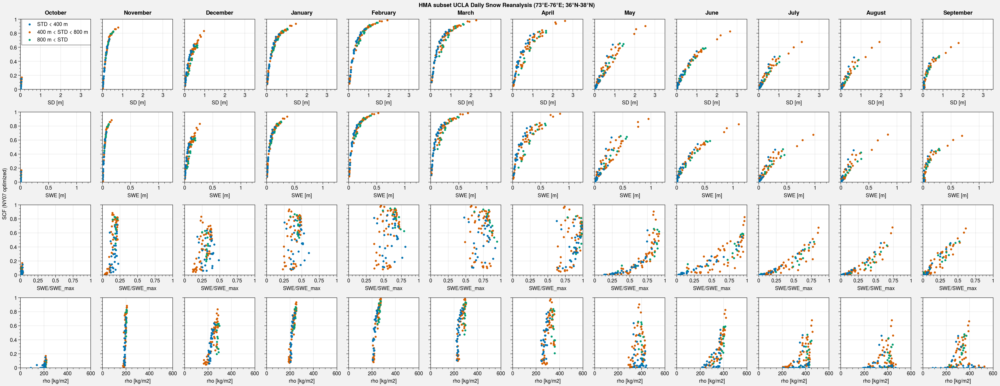

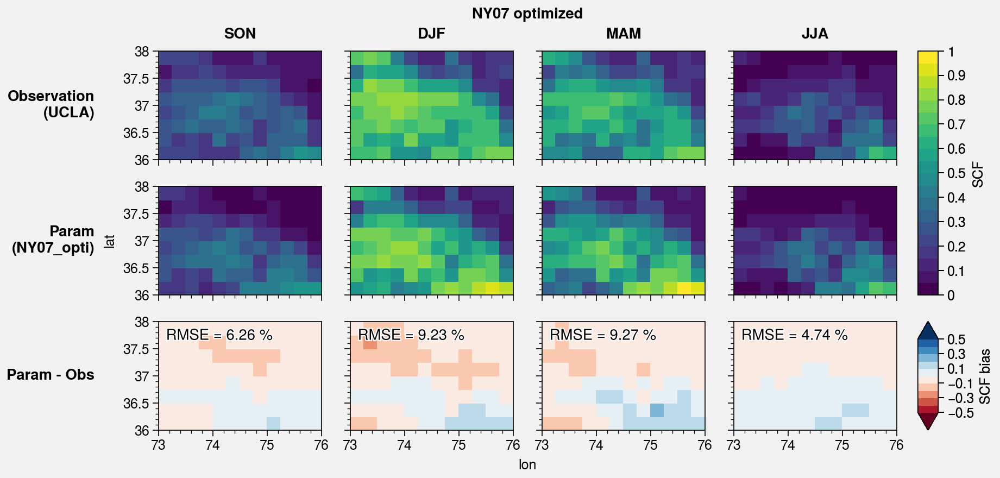

In [80]:
scf_param = scf_NY07_opti
label = 'NY07_opti'
name = 'NY07 optimized'
save = True

plot_SCF(scf_param, 'SCF ('+name+')', label, save=save)
plot_SCF_monthly(scf_param, 'SCF ('+name+')', label, save=save)
plot_bias(scf_param, name, label, save=save)

## NY07 custom (with STD)

In [15]:
def NY07_custom(sd, z0, rho_snow, rho_new, m, zstd, zstd_0):
    return np.tanh(sd/(2.5*z0*(rho_snow/rho_new*(1+zstd/zstd_0))**m))

In [140]:
# https://stackoverflow.com/questions/13670333/multiple-variables-in-scipys-optimize-minimize

import scipy.optimize as optimize

def f(params):
    # print(params)  # <-- you'll see that params is a NumPy array
    z0, rho_new, m, zstd_0 = params # <-- for readability you may wish to assign names to the component variables
    
    # rmse doesn't work... 
    # I don't know what method to use... I keep the default one here
#     mse = np.sum((np.tanh(sd_regrid/(2.5*z0*(swe_regrid/sd_regrid*1000/rho_new)**m)) - scf_regrid)**2)/scf_regrid.size
    mse = np.sum((NY07_custom(sd_regrid, z0, swe_regrid/sd_regrid*1000, rho_new, m, elevation_std_subset, zstd_0) - scf_regrid)**2)/scf_regrid.size
    
    return mse

initial_guess = [0.044, 50, 2.47, 200]
result = optimize.minimize(f, initial_guess)
if result.success:
    fitted_params = result.x
    print(fitted_params)
    print('MSE = {:0.3f}'.format(result.fun) + ' / RMSE = {:0.3f}'.format(np.sqrt(result.fun)) + ' ({:0.1f} %)'.format(np.sqrt(result.fun)*100))
else:
    raise ValueError(result.message)

[3.43944050e-03 4.91636598e+01 2.23622374e+00 1.81589172e+03]
MSE = 0.017 / RMSE = 0.131 (13.1 %)


In [16]:
scf_NY07_cust = NY07_custom(sd_regrid, 3.43944050e-03, swe_regrid/sd_regrid*1000, 4.91636598e+01, 2.23622374e+00, elevation_std_subset, 1.81589172e+03)

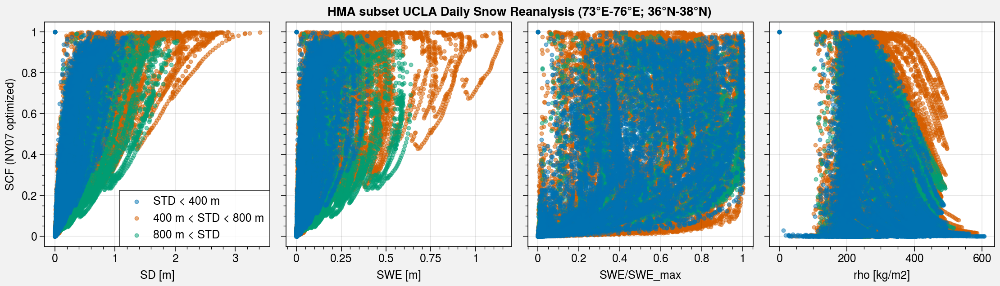

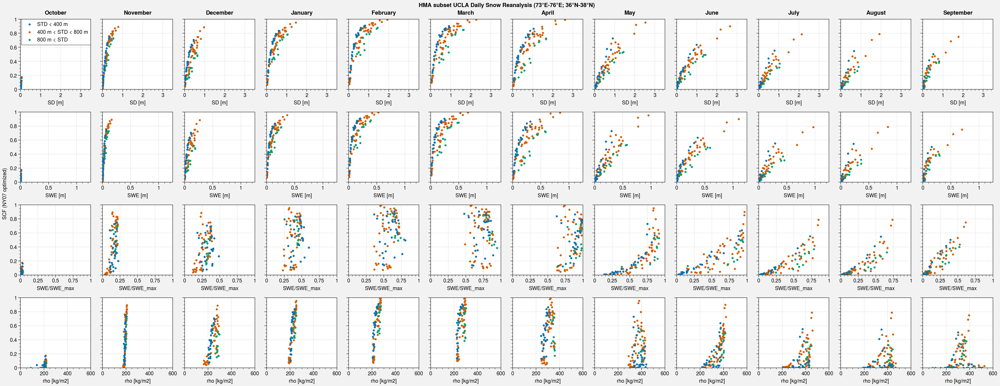

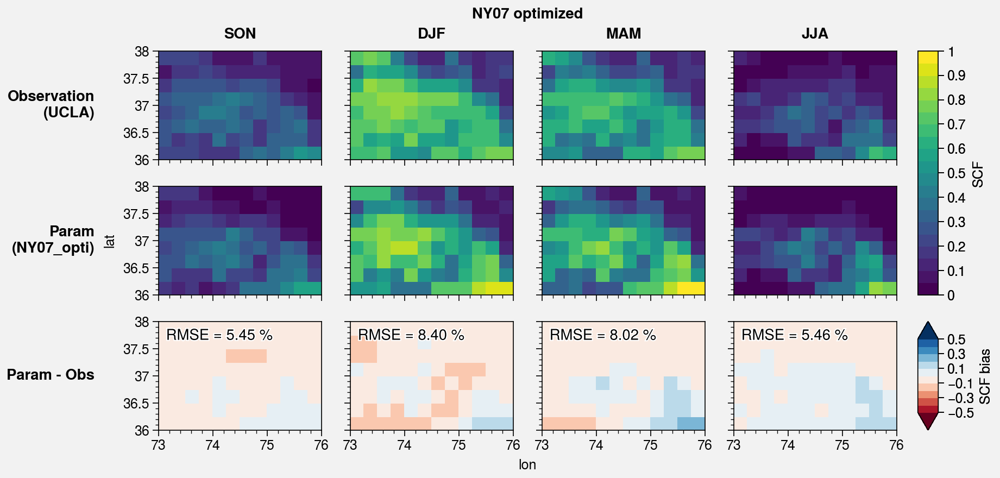

In [142]:
scf_param = NY07_custom(sd_regrid, 3.43944050e-03, swe_regrid/sd_regrid*1000, 4.91636598e+01, 2.23622374e+00, elevation_std_subset, 1.81589172e+03)
label = 'NY07_opti'
name = 'NY07 optimized'
save = False

plot_SCF(scf_param, 'SCF ('+name+')', label, save=save)
plot_SCF_monthly(scf_param, 'SCF ('+name+')', label, save=save)
plot_bias(scf_param, name, label, save=save)

In [22]:
def NY07_custom_2(sd, z0, rho_snow, rho_new, m, zstd, zstd_0, alpha):
    return (1-alpha)*np.tanh(sd/(2.5*z0*(rho_snow/rho_new*(1+zstd/zstd_0))**m))

In [156]:
# https://stackoverflow.com/questions/13670333/multiple-variables-in-scipys-optimize-minimize

import scipy.optimize as optimize

def f(params):
    # print(params)  # <-- you'll see that params is a NumPy array
    z0, rho_new, m, zstd_0, alpha = params # <-- for readability you may wish to assign names to the component variables
    
    # rmse doesn't work... 
    # I don't know what method to use... I keep the default one here
#     mse = np.sum((np.tanh(sd_regrid/(2.5*z0*(swe_regrid/sd_regrid*1000/rho_new)**m)) - scf_regrid)**2)/scf_regrid.size
    mse = np.sum((NY07_custom(sd_regrid, z0, swe_regrid/sd_regrid*1000, rho_new, m, elevation_std_subset, zstd_0, alpha) - scf_regrid)**2)/scf_regrid.size
    
    return mse

# initial_guess = [0.044, 50, 2.47, 200, -0.2]
initial_guess = [3.43944050e-03, 4.91636598e+01, 2.23622374e+00, 1.81589172e+03, -0.2]
result = optimize.minimize(f, initial_guess)
if result.success:
    fitted_params = result.x
    print(fitted_params)
    print('MSE = {:0.3f}'.format(result.fun) + ' / RMSE = {:0.3f}'.format(np.sqrt(result.fun)) + ' ({:0.1f} %)'.format(np.sqrt(result.fun)*100))
else:
    raise ValueError(result.message)

[1.05299774e-03 4.91705751e+01 2.49499081e+00 1.81589173e+03
 2.84240253e-01]
MSE = 0.011 / RMSE = 0.104 (10.4 %)


In [25]:
z0, rho_new, m, zstd_0, alpha = [1.05299774e-03, 4.91705751e+01, 2.49499081e+00, 1.81589173e+03, 2.84240253e-01]

scf_NY07_cust2 = NY07_custom_2(sd_regrid, z0, swe_regrid/sd_regrid*1000, rho_new, m, elevation_std_subset, zstd_0, alpha)

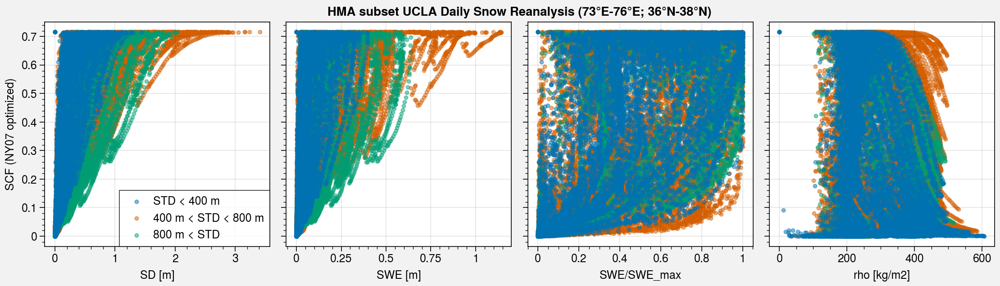

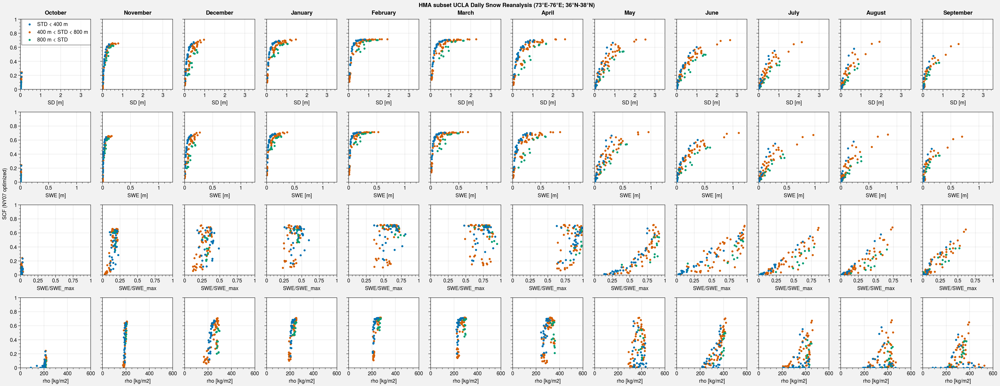

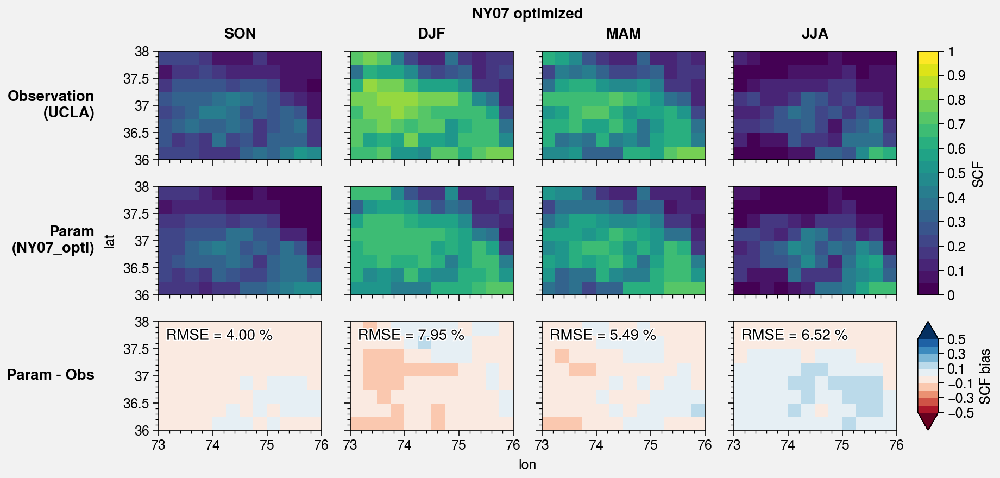

In [157]:
z0, rho_new, m, zstd_0, alpha = [1.05299774e-03, 4.91705751e+01, 2.49499081e+00, 1.81589173e+03, 2.84240253e-01]

scf_param = NY07_custom(sd_regrid, z0, swe_regrid/sd_regrid*1000, rho_new, m, elevation_std_subset, zstd_0, alpha)
label = 'NY07_opti'
name = 'NY07 optimized'
save = False

plot_SCF(scf_param, 'SCF ('+name+')', label, save=save)
plot_SCF_monthly(scf_param, 'SCF ('+name+')', label, save=save)
plot_bias(scf_param, name, label, save=save)

## Roesch et al. 2001

In [50]:
def R01(SWE, eps, zstd):
    return 0.95 * np.tanh(100*SWE) * np.sqrt( 1000*SWE / ( 1000*SWE + eps + 0.15*zstd) )

In [51]:
scf_R01 = R01(swe_regrid, 1e-6, elevation_std_subset)

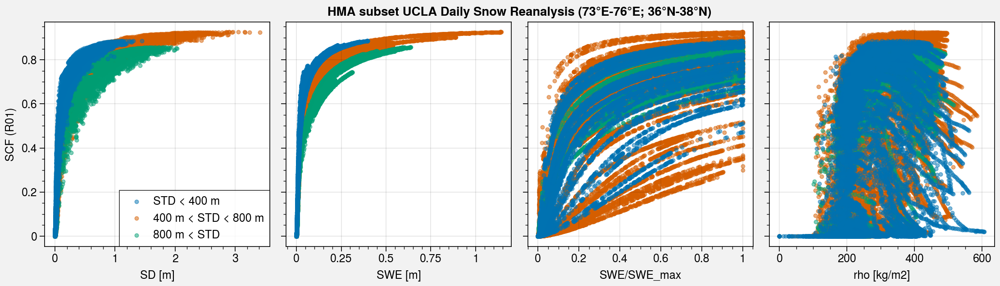

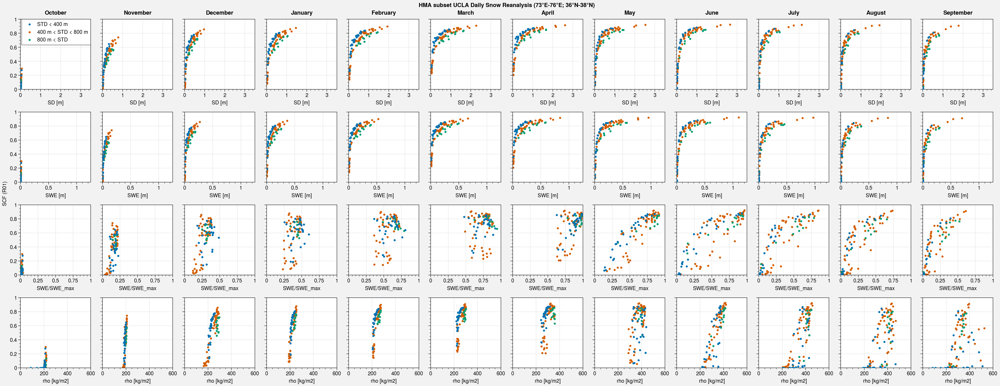

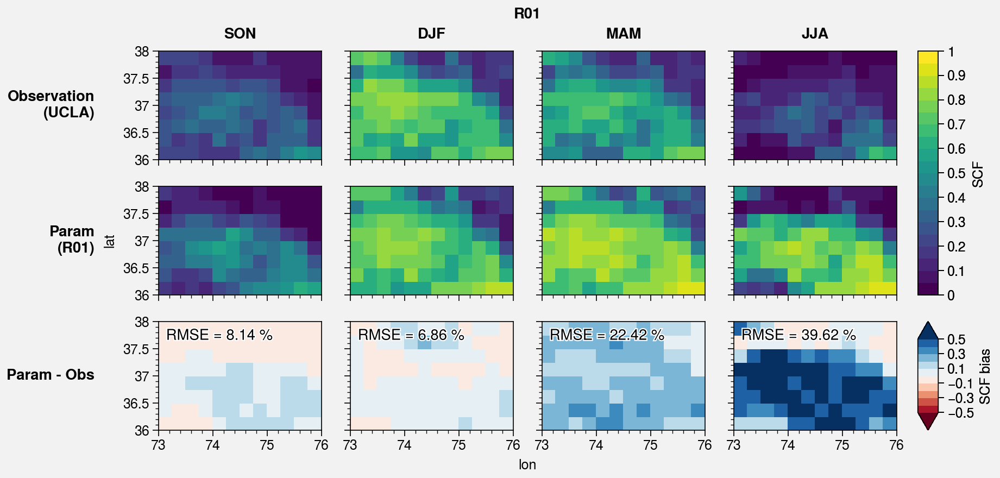

In [52]:
scf_param = scf_R01
label = 'R01'
name = 'R01'
save = False

plot_SCF(scf_param, 'SCF ('+name+')', label, save=save)
plot_SCF_monthly(scf_param, 'SCF ('+name+')', label, save=save)
plot_bias(scf_param, name, label, save=save)

In [31]:
def R01_opti(SWE, eps, zstd, alpha, a, b):
    return alpha * np.tanh(a*SWE) * np.sqrt( 1000*SWE / ( 1000*SWE + eps + b*zstd) )

In [32]:
# https://stackoverflow.com/questions/13670333/multiple-variables-in-scipys-optimize-minimize

import scipy.optimize as optimize

def f(params):
    # print(params)  # <-- you'll see that params is a NumPy array
    eps, alpha, a, b = params # <-- for readability you may wish to assign names to the component variables
    
    # rmse doesn't work... 
    # I don't know what method to use... I keep the default one here
#     mse = np.sum((np.tanh(sd_regrid/(2.5*z0*(swe_regrid/sd_regrid*1000/rho_new)**m)) - scf_regrid)**2)/scf_regrid.size
    mse = np.sum((R01_opti(swe_regrid, eps, elevation_std_subset, alpha, a, b) - scf_regrid)**2)/scf_regrid.size
    
    return mse

initial_guess = [1e-6, 0.95, 100, 0.15]
result = optimize.minimize(f, initial_guess)
if result.success:
    fitted_params = result.x
    print(fitted_params)
    print('MSE = {:0.3f}'.format(result.fun) + ' / RMSE = {:0.3f}'.format(np.sqrt(result.fun)) + ' ({:0.1f} %)'.format(np.sqrt(result.fun)*100))
else:
    raise ValueError(result.message)

[-1.32074358e-04  7.01853146e-01  1.00000567e+02  2.21673164e-01]
MSE = 0.035 / RMSE = 0.186 (18.6 %)


In [33]:
scf_R01_opti = R01_opti(swe_regrid, -1.32e-4, elevation_std_subset, 0.7, 100, 0.22)

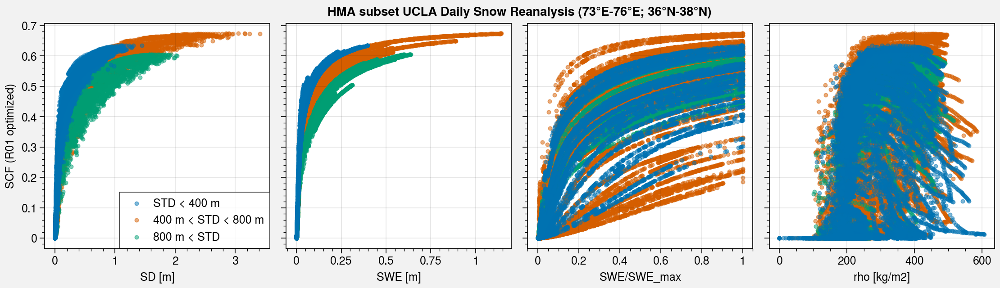

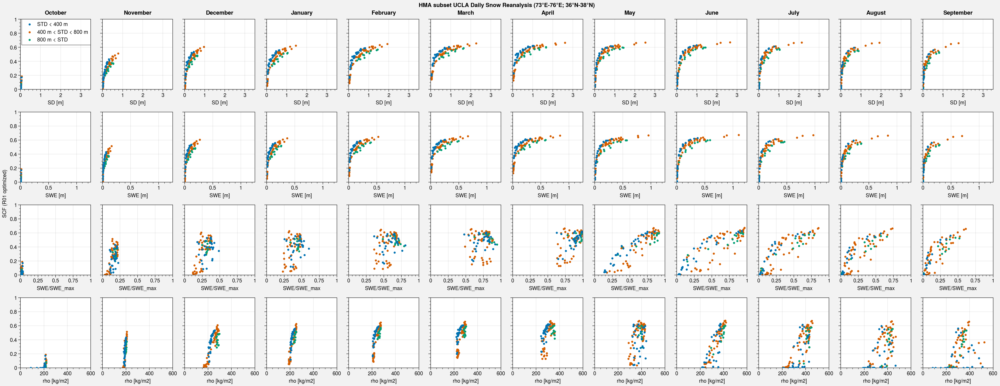

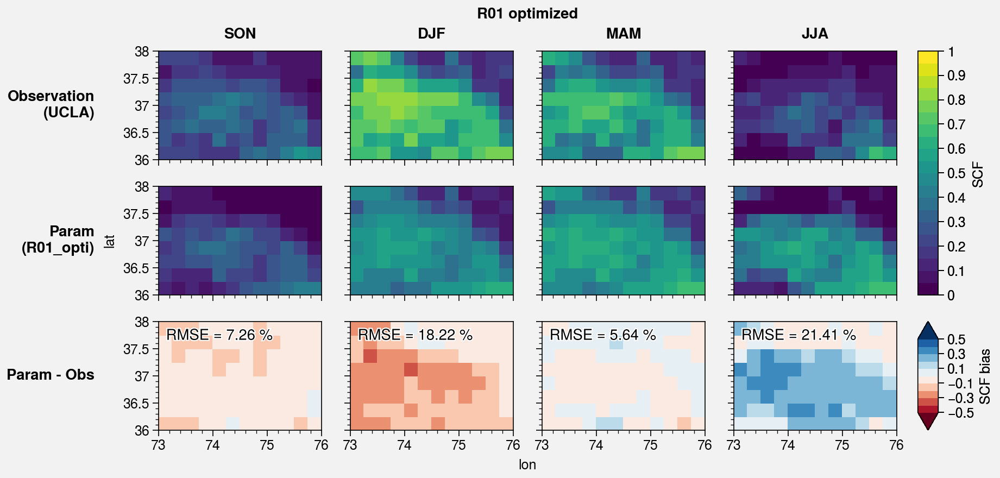

In [36]:
scf_param = scf_R01_opti
label = 'R01_opti'
name = 'R01 optimized'
save = True

plot_SCF(scf_param, 'SCF ('+name+')', label, save=save)
plot_SCF_monthly(scf_param, 'SCF ('+name+')', label, save=save)
plot_bias(scf_param, name, label, save=save)

## Check time series

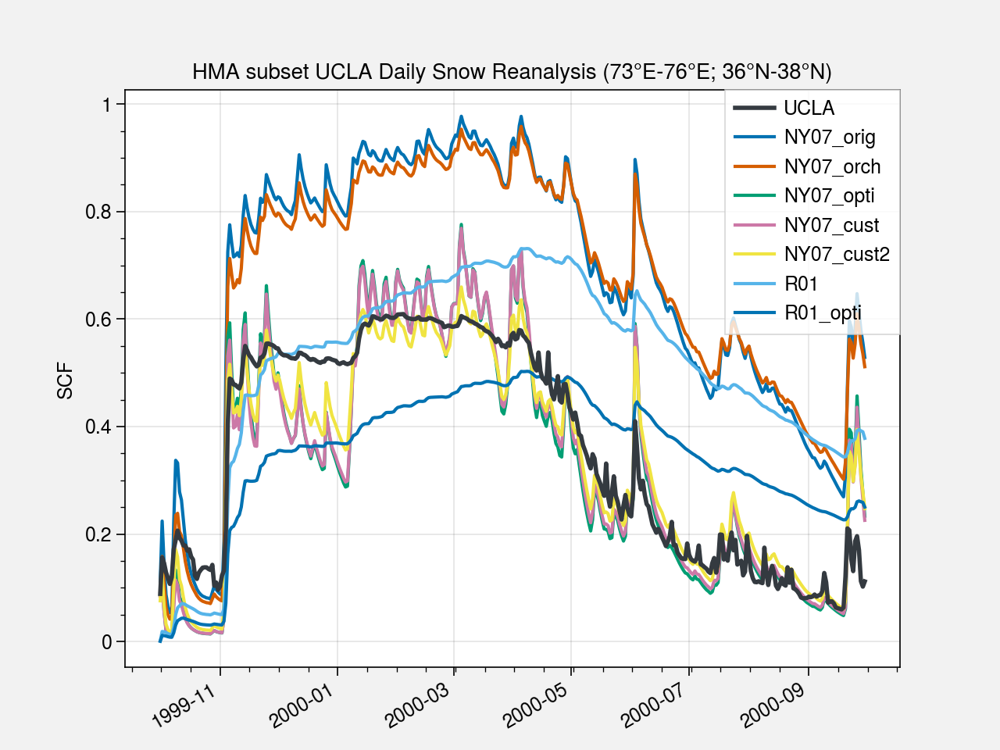

In [46]:
plt.figure()

scf_regrid.mean(('lat', 'lon')).plot(label='UCLA', color='gray8', linewidth=2, zorder=10)
scf_NY07_orig.mean(('lat', 'lon')).plot(label='NY07_orig')
scf_NY07_orch.mean(('lat', 'lon')).plot(label='NY07_orch')
scf_NY07_opti.mean(('lat', 'lon')).plot(label='NY07_opti')
scf_NY07_cust.mean(('lat', 'lon')).plot(label='NY07_cust')
scf_NY07_cust2.mean(('lat', 'lon')).plot(label='NY07_cust2')
scf_R01.mean(('lat', 'lon')).plot(label='R01')
scf_R01_opti.mean(('lat', 'lon')).plot(label='R01_opti')

plt.ylabel('SCF')
plt.xlabel('')
plt.title('HMA subset UCLA Daily Snow Reanalysis (73°E-76°E; 36°N-38°N)')

plt.legend()

plt.savefig('img/1999-2000_subset_timeseries_HMA_UCLA_params.jpg')